In [675]:
import numpy as np   
import pandas as pd    
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm
import matplotlib.pyplot as plt   
import matplotlib.style

In [676]:
df = pd.read_excel("compactiv.xlsx")

In [677]:
df.head(10)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90
5,0,0,1201,65,61,0.4,0.4,NaN,58703.0,0.0,...,0.0,0.0,0.0,0.0,28.40,34.40,Not_CPU_Bound,6854,1877461,96
6,1,0,5744,168,190,0.2,0.2,NaN,189975.0,6.0,...,0.0,4.4,0.6,0.6,27.40,28.60,Not_CPU_Bound,312,1013458,89
7,21,18,2799,291,211,0.6,0.4,NaN,259868.0,2.6,...,0.0,0.0,1.0,1.0,35.40,71.00,CPU_Bound,87,13,0
8,0,0,264,42,33,0.2,0.2,NaN,10116.0,0.0,...,0.0,0.0,0.4,0.8,15.63,18.44,Not_CPU_Bound,1374,1749756,98
9,0,0,188,13,24,0.2,0.2,NaN,6777.0,0.0,...,0.0,0.0,0.0,0.0,15.60,16.80,Not_CPU_Bound,5310,1859912,98


In [678]:
df.tail(10)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8182,10,0,5975,692,612,2.20,2.00,505718.0,475455.0,5.99,...,122.55,0.40,24.15,72.85,95.21,230.54,Not_CPU_Bound,126,1039337,77
8183,4,3,1509,501,139,0.60,1.00,312242.0,255308.0,0.00,...,0.00,0.00,3.20,3.20,52.60,119.60,CPU_Bound,1051,1600333,92
8184,8,2,4784,416,240,1.20,1.60,442876.0,110453.0,7.82,...,129.06,0.40,35.27,48.70,106.81,329.86,CPU_Bound,205,1011407,77
8185,13,0,4279,235,176,12.22,34.47,289309.0,30701.0,0.40,...,7.01,8.82,4.21,4.21,397.60,751.30,Not_CPU_Bound,184,1079269,61
8186,0,0,300,56,46,0.20,0.20,1995.0,18052.0,0.80,...,0.00,0.00,0.00,0.00,21.00,18.00,Not_CPU_Bound,272,1754832,97
8187,16,12,3009,360,244,1.60,5.81,405250.0,85282.0,8.02,...,55.11,0.60,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.40,1.80,89489.0,41764.0,3.80,...,0.20,0.80,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.60,0.60,325948.0,52640.0,0.40,...,0.00,0.40,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.20,1.20,62571.0,29505.0,1.40,...,18.04,0.40,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.60,4.80,111111.0,22256.0,0.00,...,0.00,0.20,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [679]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [680]:
df.shape

(8192, 22)

In [681]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [682]:
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.088000e+03,8.177000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,11.919712,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.398375e+05,1.408417e+05,5.307038,...,32.363520,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.409150e+04,2.291600e+04,0.000000,...,0.000000,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.254735e+05,4.661900e+04,0.000000,...,0.000000,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.678288e+05,1.061010e+05,2.400000,...,5.000000,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,523.000000,1237.000000,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000


In [683]:
df.duplicated().sum()

0

In [684]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [685]:
df['rchar'].mean()

197385.72836300693

In [686]:
df['wchar'].mean()

95902.99278463985

In [687]:
df['rchar'] = df['rchar'].replace(np.nan,df['rchar'].mean())
df['wchar'] = df['wchar'].replace(np.nan,df['wchar'].mean())

In [688]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

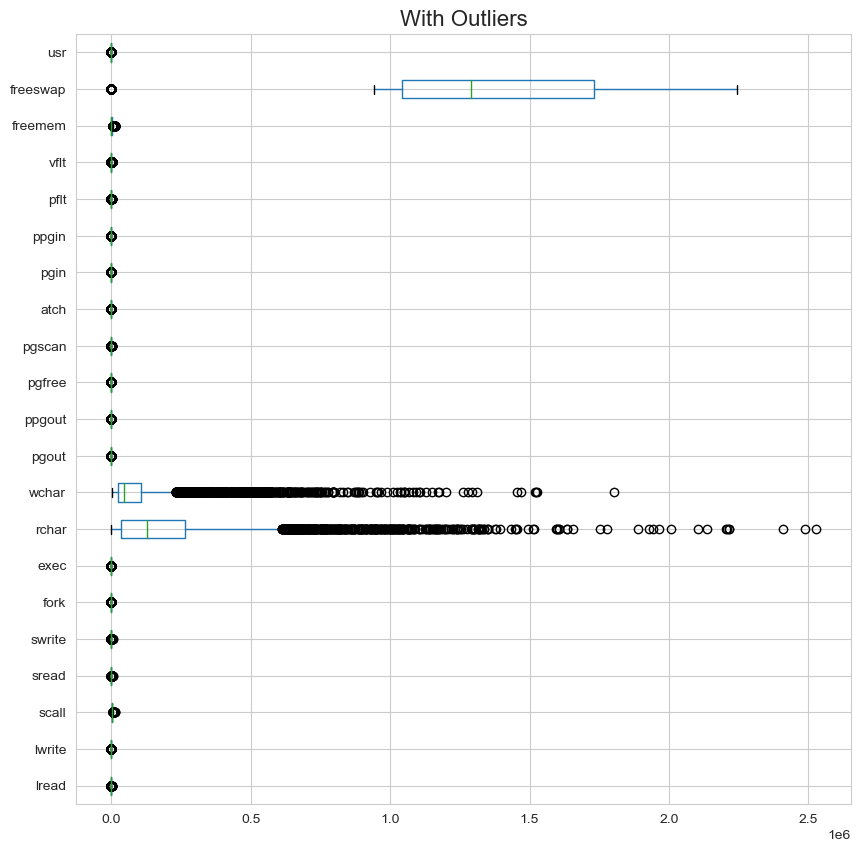

In [689]:
cont=df.dtypes[(df.dtypes!='object')].index
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

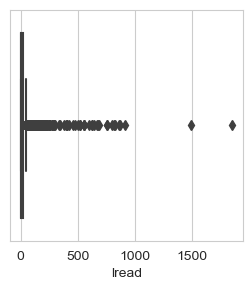

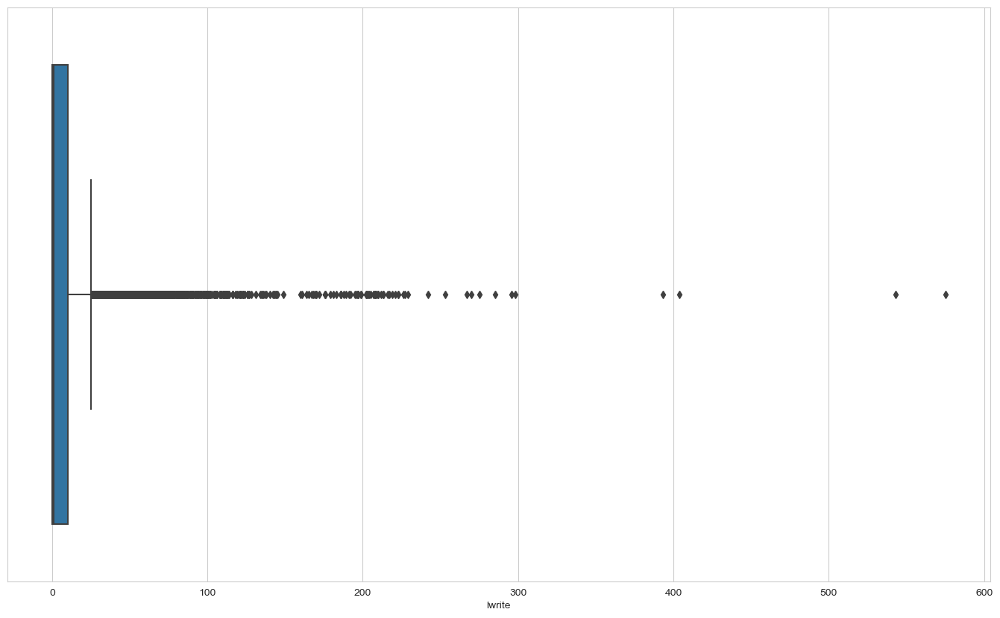

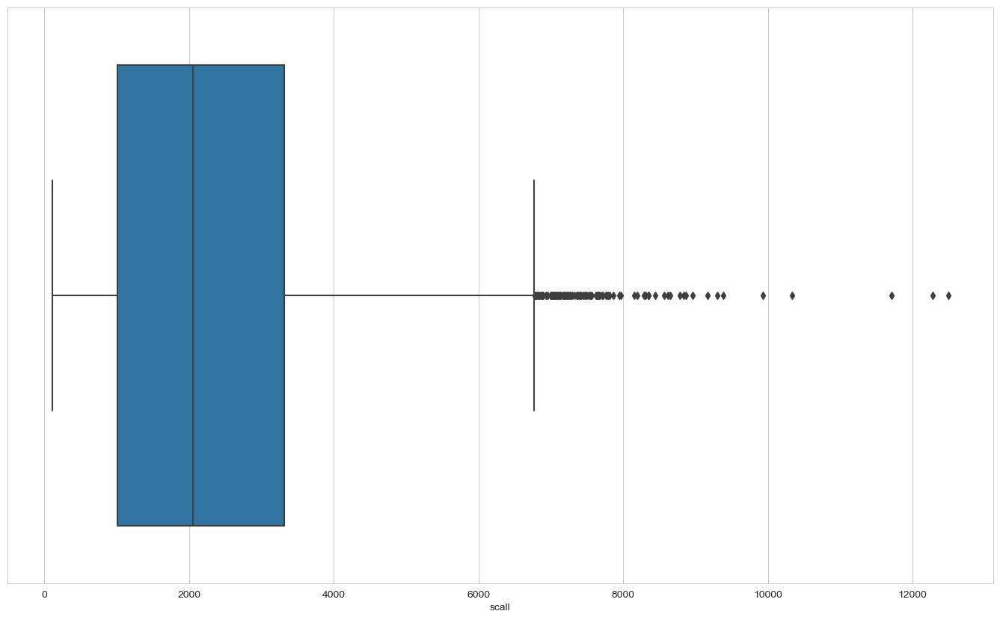

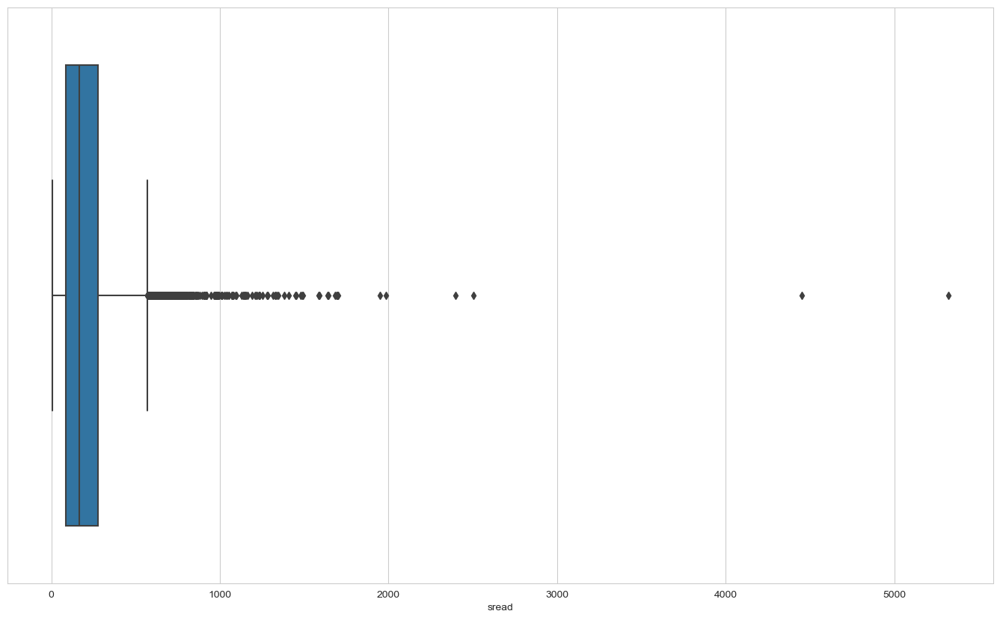

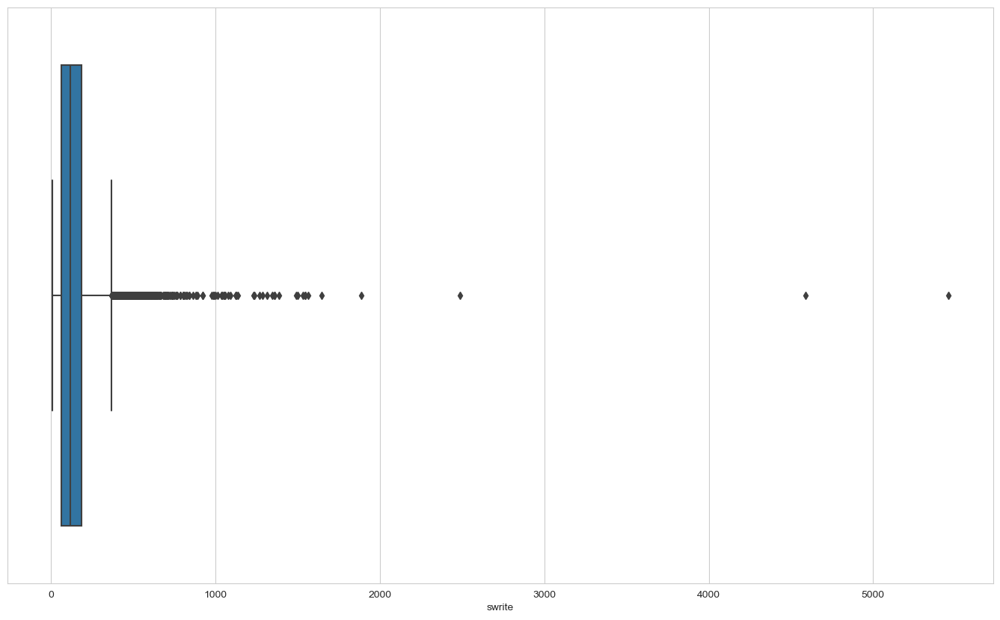

...

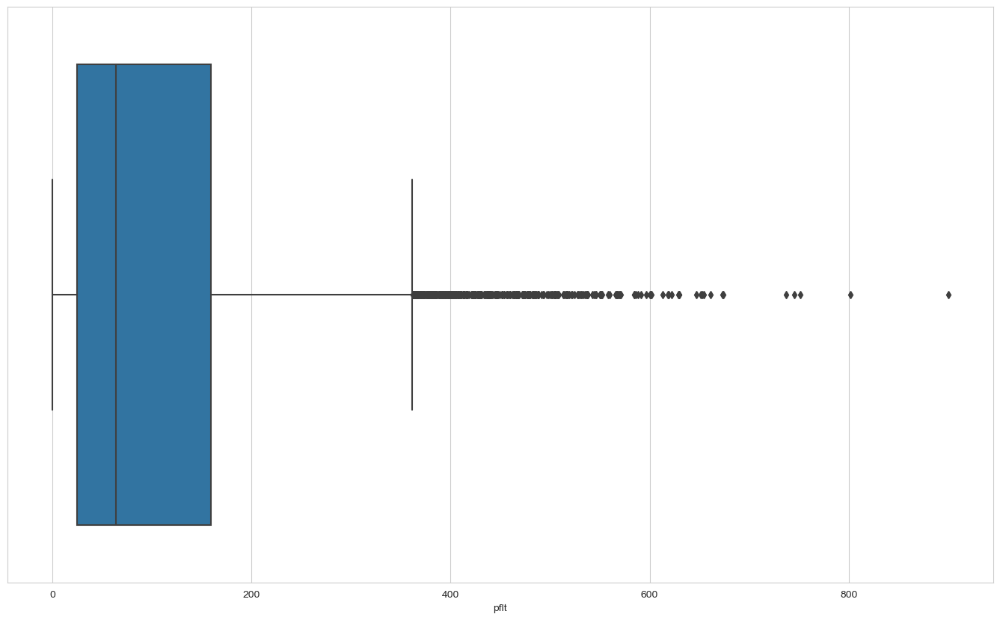

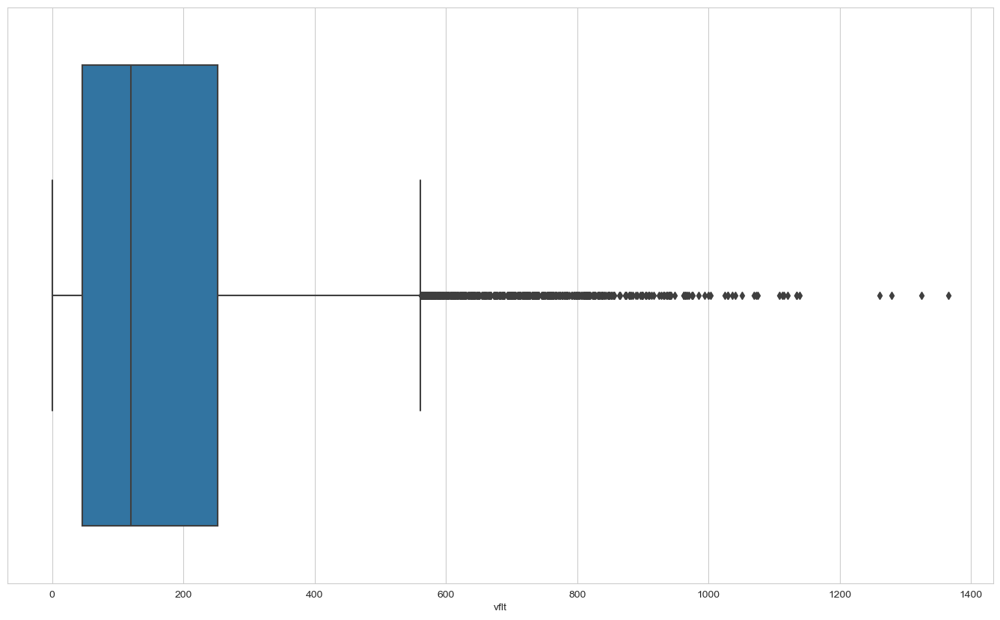

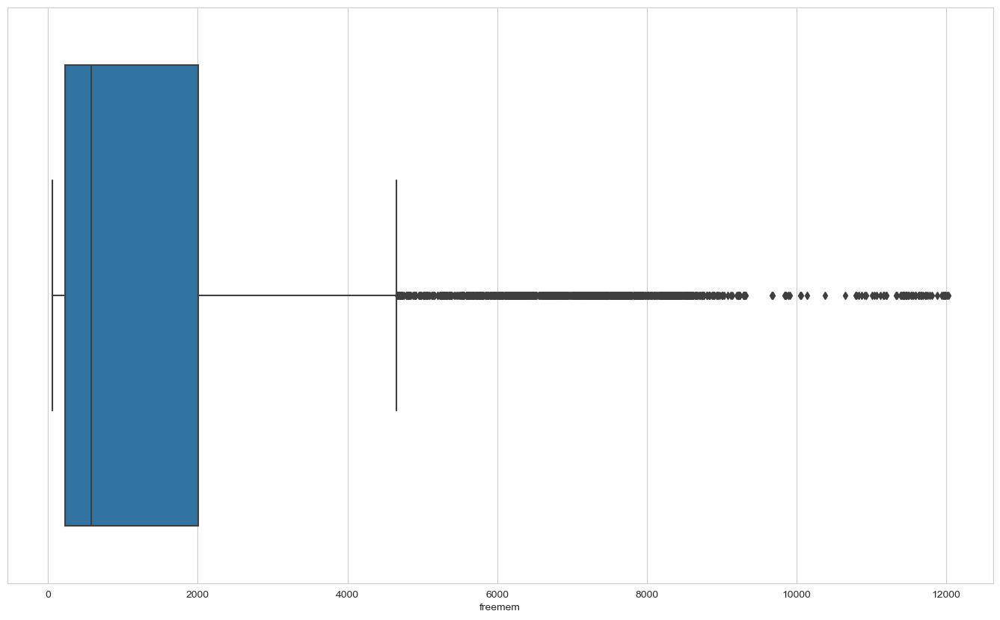

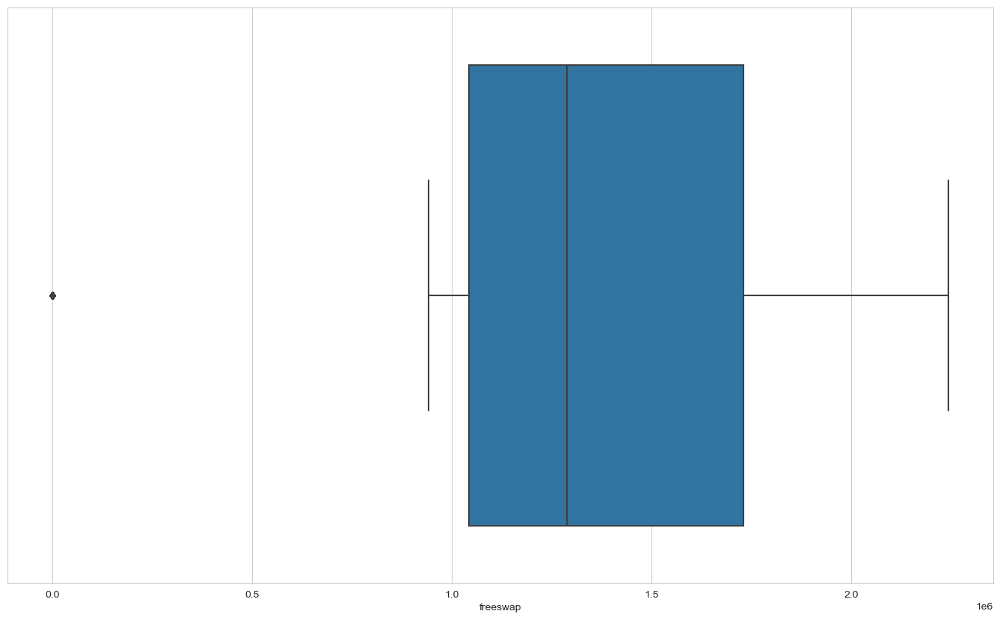

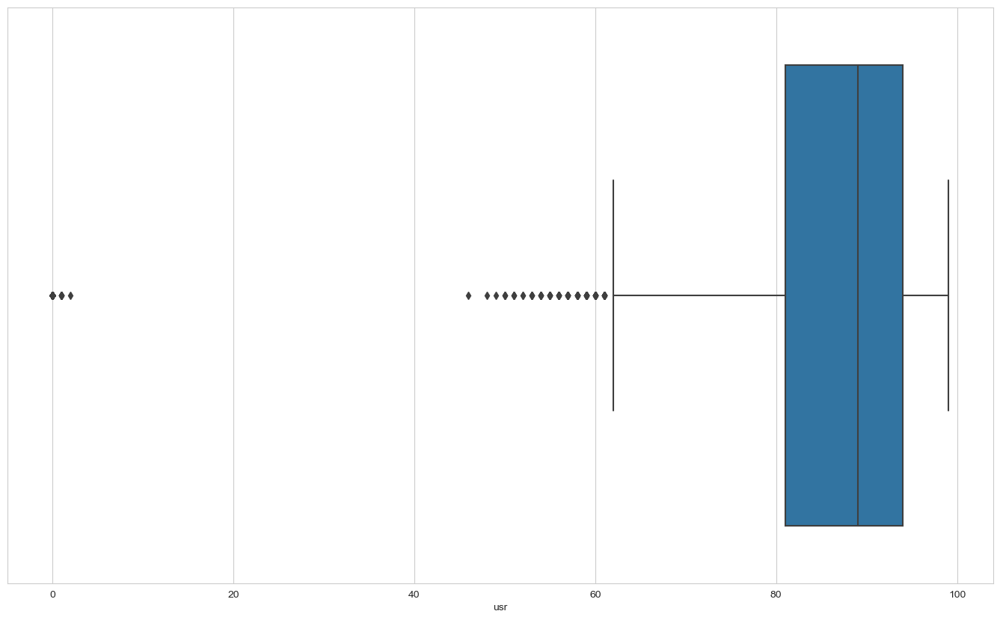

In [690]:
plt.figure(figsize=(3,3))
sns.boxplot(data=df, x='lread');
plt.show()
sns.boxplot(data=df, x='lwrite');
plt.show()
sns.boxplot(data=df, x='scall');
plt.show()
sns.boxplot(data=df, x='sread');
plt.show()
sns.boxplot(data=df, x='swrite');
plt.show()
sns.boxplot(data=df, x='fork');
plt.show()
sns.boxplot(data=df, x='exec');
plt.show()
sns.boxplot(data=df, x='rchar');
plt.show()
sns.boxplot(data=df, x='wchar');
plt.show()
sns.boxplot(data=df, x='pgout');
plt.show()
sns.boxplot(data=df, x='ppgout');
plt.show()
sns.boxplot(data=df, x='pgfree');
plt.show()
sns.boxplot(data=df, x='pgscan');
plt.show()
sns.boxplot(data=df, x='atch');
plt.show()
sns.boxplot(data=df, x='pgin');
plt.show()
sns.boxplot(data=df, x='ppgin');
plt.show()
sns.boxplot(data=df, x='pflt');
plt.show()
sns.boxplot(data=df, x='vflt');
plt.show()
sns.boxplot(data=df, x='freemem');
plt.show()
sns.boxplot(data=df, x='freeswap');
plt.show()
sns.boxplot(data=df, x='usr');
plt.show()

In [691]:
for i in df.columns:
    if df[i].dtype =='object':
        print(df[i].value_counts().sort_values())
        print('\n')

CPU_Bound        3861
Not_CPU_Bound    4331
Name: runqsz, dtype: int64




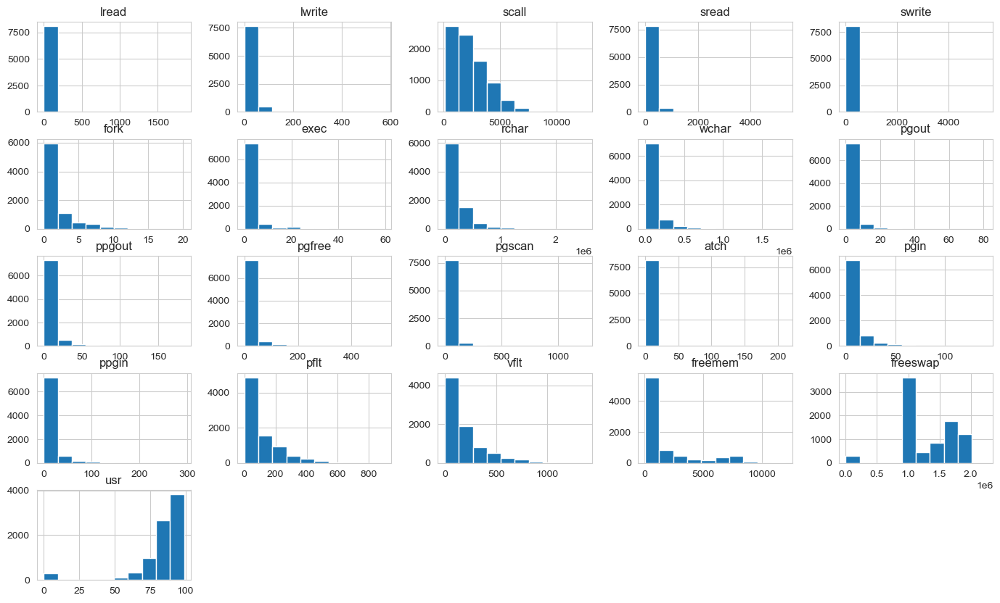

In [692]:
from pylab import rcParams
rcParams['figure.figsize'] = 17,10
df.hist();

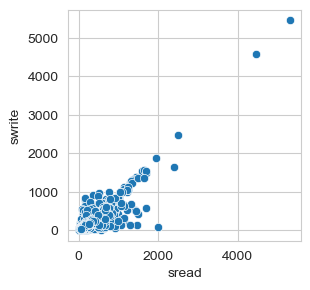

In [693]:
plt.figure(figsize=(3,3))
sns.scatterplot(data=df, x='sread', y='swrite');

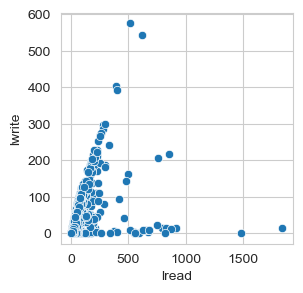

In [694]:
plt.figure(figsize=(3,3))
sns.scatterplot(data=df, x='lread', y='lwrite');

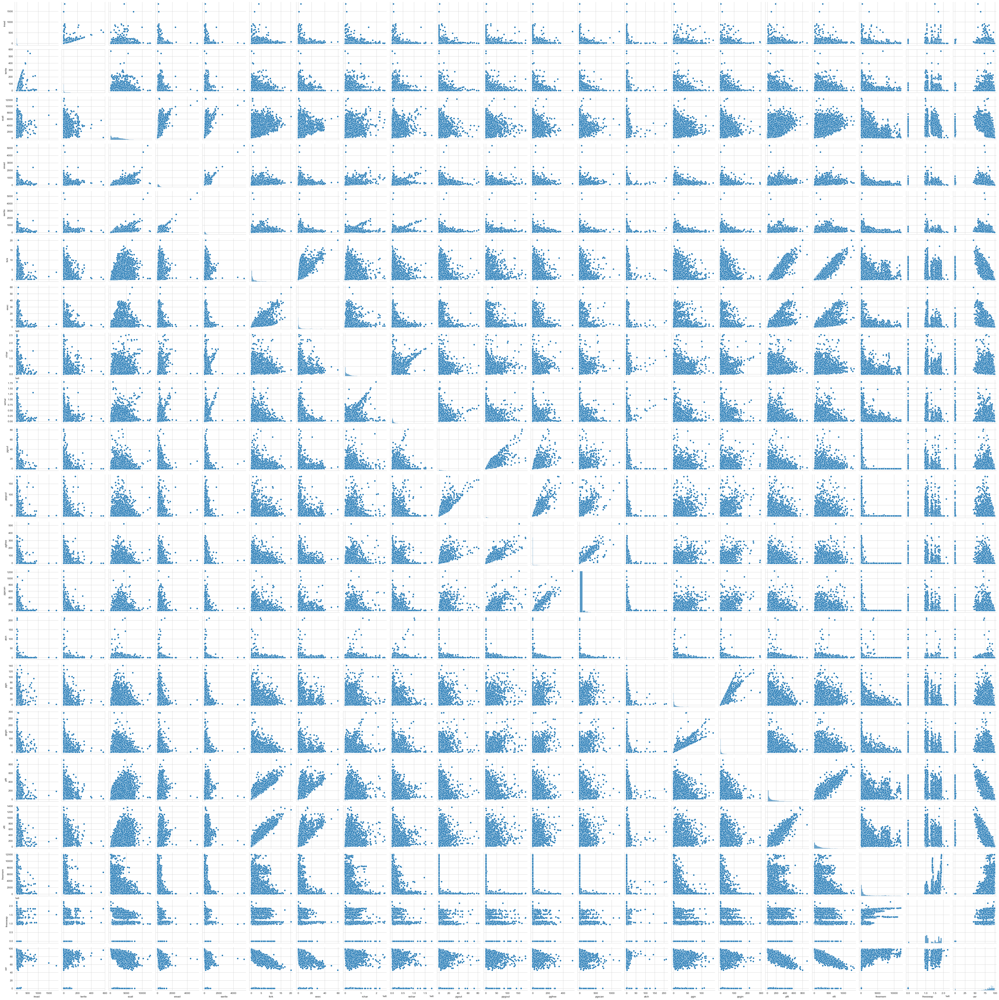

In [695]:
sns.pairplot(df)
plt.show()

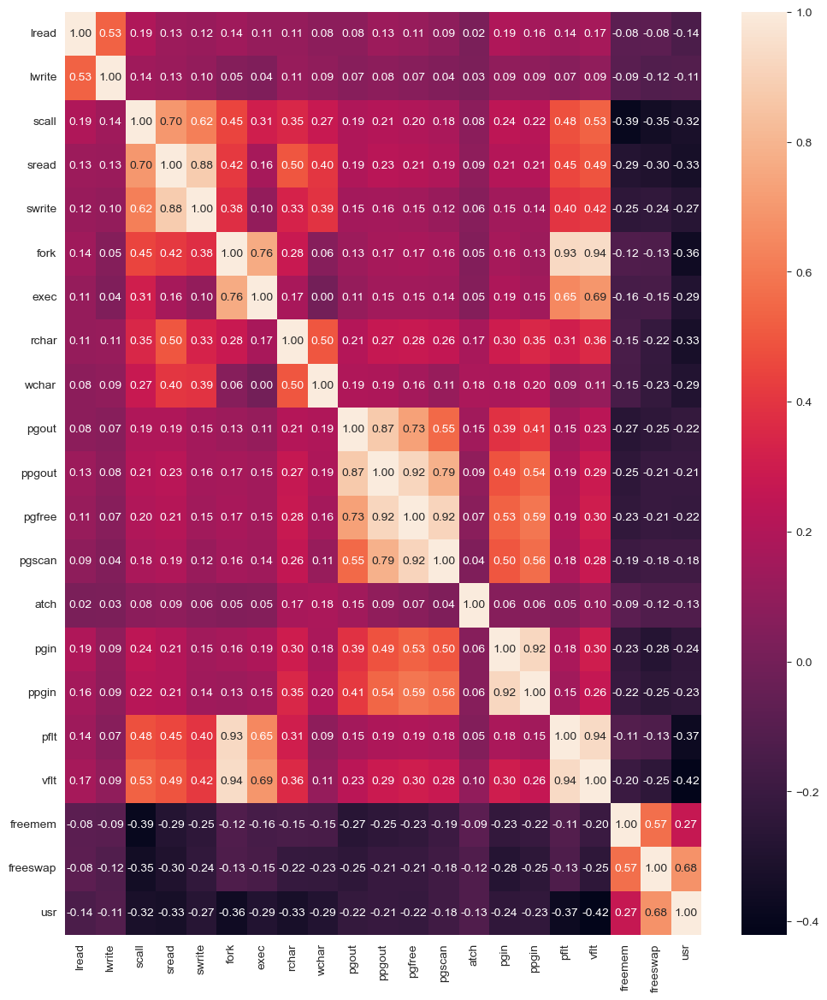

In [696]:
plt.figure(figsize=(12,14))
sns.heatmap(df.corr(),annot=True,fmt=".2f");

In [697]:
df = pd.get_dummies(df, columns=['runqsz'],drop_first=True)

In [698]:
df['runqsz_Not_CPU_Bound'].value_counts()

1    4331
0    3861
Name: runqsz_Not_CPU_Bound, dtype: int64

In [699]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


In [700]:
# Copy all the predictor variables into X dataframe
X = df.drop('usr', axis=1)

# Copy target into the y dataframe. 
y = df[['usr']]

In [701]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=10)

### Linear Regression using statsmodel(OLS)

In [702]:
import statsmodels.api as sm
X_train=sm.add_constant(X_train)
X_test=sm.add_constant(X_test)
model = sm.OLS(y_train,X_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     458.1
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:33:55   Log-Likelihood:                -21862.
No. Observations:                5734   AIC:                         4.377e+04
Df Residuals:                    5712   BIC:                         4.391e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.5696 

In [703]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   26.427961
lread                    1.562160
lwrite                   1.501725
scall                    2.630832
sread                    6.448713
swrite                   5.361789
fork                    18.404591
exec                     3.201066
rchar                    2.003105
wchar                    1.736709
pgout                    5.327906
ppgout                  14.759394
pgfree                  18.014051
pgscan                   7.272316
atch                     1.093981
pgin                     7.818040
ppgin                    8.466463
pflt                    11.371461
vflt                    19.446126
freemem                  1.659154
freeswap                 1.724998
runqsz_Not_CPU_Bound     1.109727
dtype: float64



In [704]:
X_train4 = X_train.drop(["sread"], axis=1)
olsmod_1 = sm.OLS(y_train, X_train4)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.626


On dropping 'sread', adj. R-squared almost remains the same

In [705]:
X_train5 = X_train.drop(["fork"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train5)
olsres_2 = olsmod_2.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared: 0.624 
Adjusted R-squared: 0.623


On dropping 'fork', adj. R-squared decresed by 0.003

In [706]:
X_train6 = X_train.drop(["ppgout"], axis=1)
olsmod_3 = sm.OLS(y_train, X_train6)
olsres_3 = olsmod_3.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.625


On dropping 'ppgout', adj. R-squared decresed by 0.001

In [707]:
X_train7 = X_train.drop(["pgfree"], axis=1)
olsmod_4 = sm.OLS(y_train, X_train7)
olsres_4 = olsmod_4.fit()
print(
    "R-squared:",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared: 0.626 
Adjusted R-squared: 0.625


On dropping 'pgfree', adj. R-squared decresed by 0.001

In [708]:
X_train8 = X_train.drop(["pgscan"], axis=1)
olsmod_5 = sm.OLS(y_train, X_train8)
olsres_5 = olsmod_5.fit()
print(
    "R-squared:",
    np.round(olsres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_5.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.626


On dropping 'pgscan', adj. R-squared almost remains the same

In [709]:
X_train9 = X_train.drop(["pgin"], axis=1)
olsmod_6 = sm.OLS(y_train, X_train9)
olsres_6 = olsmod_6.fit()
print(
    "R-squared:",
    np.round(olsres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_6.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.626


On dropping 'pgin', adj. R-squared almost remains the same

In [710]:
X_train10 = X_train.drop(["ppgin"], axis=1)
olsmod_7 = sm.OLS(y_train, X_train10)
olsres_7 = olsmod_7.fit()
print(
    "R-squared:",
    np.round(olsres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_7.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.626


On dropping 'ppgin', adj. R-squared almost remains the same

In [711]:
X_train11 = X_train.drop(["pflt"], axis=1)
olsmod_8 = sm.OLS(y_train, X_train11)
olsres_8 = olsmod_8.fit()
print(
    "R-squared:",
    np.round(olsres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_8.rsquared_adj, 3),
)

R-squared: 0.623 
Adjusted R-squared: 0.621


On dropping 'pflt', adj. R-squared decresed by 0.005

In [712]:
X_train12 = X_train.drop(["vflt"], axis=1)
olsmod_9 = sm.OLS(y_train, X_train12)
olsres_9 = olsmod_9.fit()
print(
    "R-squared:",
    np.round(olsres_9.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_9.rsquared_adj, 3),
)

R-squared: 0.625 
Adjusted R-squared: 0.624


On dropping 'vflt', adj. R-squared decresed by 0.002

In [713]:
X_train13 = X_train.drop(["swrite"], axis=1)
olsmod_10 = sm.OLS(y_train, X_train13)
olsres_10 = olsmod_10.fit()
print(
    "R-squared:",
    np.round(olsres_10.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_10.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.626


On dropping 'swrite', adj. R-squared almost remains the same

In [714]:
X_train14 = X_train.drop(["pgout"], axis=1)
olsmod_11 = sm.OLS(y_train, X_train14)
olsres_11 = olsmod_11.fit()
print(
    "R-squared:",
    np.round(olsres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_11.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.625


On dropping 'pgout', adj. R-squared decresed by 0.001

In [715]:
X_train = X_train.drop(["sread","pgscan","pgin","ppgin","swrite"], axis=1)

In [716]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5734 entries, 5563 to 1289
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   const                 5734 non-null   float64
 1   lread                 5734 non-null   int64  
 2   lwrite                5734 non-null   int64  
 3   scall                 5734 non-null   int64  
 4   fork                  5734 non-null   float64
 5   exec                  5734 non-null   float64
 6   rchar                 5734 non-null   float64
 7   wchar                 5734 non-null   float64
 8   pgout                 5734 non-null   float64
 9   ppgout                5734 non-null   float64
 10  pgfree                5734 non-null   float64
 11  atch                  5734 non-null   float64
 12  pflt                  5734 non-null   float64
 13  vflt                  5734 non-null   float64
 14  freemem               5734 non-null   int64  
 15  freeswap          

In [717]:
olsmod_12 = sm.OLS(y_train, X_train)
olsres_12 = olsmod_12.fit()
print(olsres_12.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     600.5
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:33:57   Log-Likelihood:                -21866.
No. Observations:                5734   AIC:                         4.377e+04
Df Residuals:                    5717   BIC:                         4.388e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.5724 

In [718]:
vif_series2 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))

VIF values: 

const                   26.179259
lread                    1.515928
lwrite                   1.488103
scall                    1.816859
fork                    16.420499
exec                     2.623276
rchar                    1.636277
wchar                    1.468257
pgout                    4.946267
ppgout                  14.421828
pgfree                   8.111463
atch                     1.090586
pflt                    11.201551
vflt                    17.824893
freemem                  1.646671
freeswap                 1.714903
runqsz_Not_CPU_Bound     1.099752
dtype: float64



####  multicollinearity is still present in the data.

In [719]:
X_train15 = X_train.drop(["fork"], axis=1)
olsmod_13 = sm.OLS(y_train, X_train15)
olsres_13 = olsmod_13.fit()
print(
    "R-squared:",
    np.round(olsres_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_13.rsquared_adj, 3),
)

R-squared: 0.622 
Adjusted R-squared: 0.621


On dropping 'fork', adj. R-squared decresed by 0.005

In [720]:
X_train16 = X_train.drop(["ppgout"], axis=1)
olsmod_14 = sm.OLS(y_train, X_train16)
olsres_14 = olsmod_14.fit()
print(
    "R-squared:",
    np.round(olsres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_14.rsquared_adj, 3),
)

R-squared: 0.626 
Adjusted R-squared: 0.625


On dropping 'ppgout', adj. R-squared decresed by 0.001

In [721]:
X_train17 = X_train.drop(["pgout"], axis=1)
olsmod_15 = sm.OLS(y_train, X_train17)
olsres_15 = olsmod_15.fit()
print(
    "R-squared:",
    np.round(olsres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_15.rsquared_adj, 3),
)

R-squared: 0.626 
Adjusted R-squared: 0.625


On dropping 'pgout', adj. R-squared decresed by 0.001

In [722]:
X_train18 = X_train.drop(["pgfree"], axis=1)
olsmod_16 = sm.OLS(y_train, X_train18)
olsres_16 = olsmod_16.fit()
print(
    "R-squared:",
    np.round(olsres_16.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_16.rsquared_adj, 3),
)

R-squared: 0.626 
Adjusted R-squared: 0.625


On dropping 'pgfree', adj. R-squared decresed by 0.001

In [723]:
X_train19 = X_train.drop(["pflt"], axis=1)
olsmod_17 = sm.OLS(y_train, X_train19)
olsres_17 = olsmod_17.fit()
print(
    "R-squared:",
    np.round(olsres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_17.rsquared_adj, 3),
)

R-squared: 0.622 
Adjusted R-squared: 0.621


On dropping 'pflt', adj. R-squared decresed by 0.005

In [724]:
X_train20 = X_train.drop(["vflt"], axis=1)
olsmod_18 = sm.OLS(y_train, X_train20)
olsres_18 = olsmod_18.fit()
print(
    "R-squared:",
    np.round(olsres_18.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_18.rsquared_adj, 3),
)

R-squared: 0.624 
Adjusted R-squared: 0.623


On dropping 'vflt', adj. R-squared decresed by 0.003

In [725]:
X_train21 = X_train.drop(["exec"], axis=1)
olsmod_20 = sm.OLS(y_train, X_train21)
olsres_20 = olsmod_20.fit()
print(
    "R-squared:",
    np.round(olsres_20.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_20.rsquared_adj, 3),
)

R-squared: 0.627 
Adjusted R-squared: 0.626


In [726]:
X_train = X_train.drop(["exec","pgout","ppgout","pgfree"], axis=1)

In [727]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5734 entries, 5563 to 1289
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   const                 5734 non-null   float64
 1   lread                 5734 non-null   int64  
 2   lwrite                5734 non-null   int64  
 3   scall                 5734 non-null   int64  
 4   fork                  5734 non-null   float64
 5   rchar                 5734 non-null   float64
 6   wchar                 5734 non-null   float64
 7   atch                  5734 non-null   float64
 8   pflt                  5734 non-null   float64
 9   vflt                  5734 non-null   float64
 10  freemem               5734 non-null   int64  
 11  freeswap              5734 non-null   int64  
 12  runqsz_Not_CPU_Bound  5734 non-null   uint8  
dtypes: float64(7), int64(5), uint8(1)
memory usage: 588.0 KB


In [728]:
olsmod_19 = sm.OLS(y_train, X_train)
olsres_19 = olsmod_19.fit()
print(olsres_19.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.623
Model:                            OLS   Adj. R-squared:                  0.622
Method:                 Least Squares   F-statistic:                     787.1
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:33:59   Log-Likelihood:                -21897.
No. Observations:                5734   AIC:                         4.382e+04
Df Residuals:                    5721   BIC:                         4.391e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.3010 

In [729]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const                   25.318999
lread                    1.503823
lwrite                   1.486819
scall                    1.801087
fork                    11.534091
rchar                    1.603720
wchar                    1.442977
atch                     1.058418
pflt                    10.489386
vflt                    15.100148
freemem                  1.604210
freeswap                 1.684260
runqsz_Not_CPU_Bound     1.095098
dtype: float64



In [730]:
X_train22 = X_train.drop(["fork"], axis=1)
olsmod_21 = sm.OLS(y_train, X_train22)
olsres_21 = olsmod_21.fit()
print(
    "R-squared:",
    np.round(olsres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_21.rsquared_adj, 3),
)

R-squared: 0.619 
Adjusted R-squared: 0.618


On dropping 'fork', adj. R-squared decresed by 0.004

In [731]:
X_train23 = X_train.drop(["pflt"], axis=1)
olsmod_22 = sm.OLS(y_train, X_train23)
olsres_22 = olsmod_22.fit()
print(
    "R-squared:",
    np.round(olsres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_22.rsquared_adj, 3),
)

R-squared: 0.618 
Adjusted R-squared: 0.617


On dropping 'pflt', adj. R-squared decresed by 0.005

In [732]:
X_train24 = X_train.drop(["vflt"], axis=1)
olsmod_23 = sm.OLS(y_train, X_train24)
olsres_23 = olsmod_23.fit()
print(
    "R-squared:",
    np.round(olsres_23.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_23.rsquared_adj, 3),
)

R-squared: 0.621 
Adjusted R-squared: 0.621


On dropping 'vflt', adj. R-squared decresed by 0.001

In [733]:
X_train = X_train.drop(["vflt","fork"], axis=1)

In [734]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5734 entries, 5563 to 1289
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   const                 5734 non-null   float64
 1   lread                 5734 non-null   int64  
 2   lwrite                5734 non-null   int64  
 3   scall                 5734 non-null   int64  
 4   rchar                 5734 non-null   float64
 5   wchar                 5734 non-null   float64
 6   atch                  5734 non-null   float64
 7   pflt                  5734 non-null   float64
 8   freemem               5734 non-null   int64  
 9   freeswap              5734 non-null   int64  
 10  runqsz_Not_CPU_Bound  5734 non-null   uint8  
dtypes: float64(5), int64(5), uint8(1)
memory usage: 498.4 KB


In [735]:
olsmod_24 = sm.OLS(y_train, X_train)
olsres_24 = olsmod_24.fit()
print(olsres_24.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.619
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     928.6
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:34:00   Log-Likelihood:                -21928.
No. Observations:                5734   AIC:                         4.388e+04
Df Residuals:                    5723   BIC:                         4.395e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.4404 

In [736]:
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const                   23.419143
lread                    1.497829
lwrite                   1.481282
scall                    1.744288
rchar                    1.531827
wchar                    1.419778
atch                     1.046209
pflt                     1.383714
freemem                  1.596557
freeswap                 1.571209
runqsz_Not_CPU_Bound     1.094119
dtype: float64



#### Testing the Assumptions of Linear Regression

For Linear Regression, we need to check if the following assumptions hold:-
    
Linearity

Independence

Homoscedasticity

Normality of error terms

No strong Multicollinearity

#### Linearity and Independence of predictors

In [737]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Fitted Values"] = olsres_24.fittedvalues.values  # predicted values
df_pred["Residuals"] = olsres_24.resid.values  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
0,68,62.685299,5.314701
1,96,84.841808,11.158192
2,87,83.321521,3.678479
3,84,81.446208,2.553792
4,93,101.159866,-8.159866


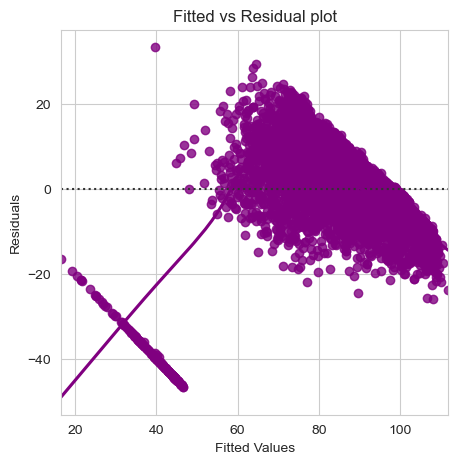

In [738]:
# let us plot the fitted values vs residuals
plt.figure(figsize=(5,5))
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

#### Test for Normality

In [739]:
from scipy import stats
stats.shapiro(df_pred["Residuals"])

E:\Anaconda\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9078813195228577, pvalue=0.0)

#### Since p-value < 0.05, the residuals are not normal as per shapiro test.

#### The model built olsmod_6 satisfies all assumptions of Linear Regression

In [740]:
olsres_24.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.619
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     928.6
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:34:12   Log-Likelihood:                -21928.
No. Observations:                5734   AIC:                         4.388e+04
Df Residuals:                    5723   BIC:                         4.395e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.4404      0.709     64.099      0.000      44.051      46.830
lread                   -0.0215      0.003     -6.280      0.000      -0.028      -0.015
lwrite                   0.0147      0.006      2.485      0.013       0.003       0.026
scall                    0.0011      0.000      9.036      0.000       0.001       0.001
rchar                -3.889e-06   7.65e-07     -5.081      0.000   -5.39e-06   -2.39e-06
wchar                -1.112e-05   1.27e-06     -8.726      0.000   -1.36e-05   -8.62e-06
atch                    -0.0936      0.032     -2.897      0.004      -0.157      -0.030
pflt                    -0.0467      0.002    -31.007      0.000      -0.050      -0.044
freemem                 -0.0015   7.45e-05    -19.861      0.000      -0.002      -0.001
freeswap              3.166e-05    4.4e-07     71.888      0.000    3.08e-05    3.25e-05
runqsz_Not_CPU_Bound     7.6107      0.307     24.799      0.000       7.009       8.212
==============================================================================
Omnibus:                     1568.511   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5163.723
Skew:                          -1.373   Prob(JB):                         0.00
Kurtosis:                       6.751   Cond. No.                     6.91e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.91e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [741]:
X_train.columns

Index(['const', 'lread', 'lwrite', 'scall', 'rchar', 'wchar', 'atch', 'pflt',
       'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [742]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [743]:
# dropping columns from the test data that are not there in the training data
X_test = X_test.drop(
    ['sread', 'swrite','fork','exec','pgout','ppgout','pgfree', 'pgscan','pgin',
       'ppgin','vflt',], axis=1
)

In [744]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'rchar', 'wchar', 'atch', 'pflt',
       'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [745]:
# let's make predictions on the test set
y_pred_test4 = olsres_24.predict(X_test)
y_pred_train4 = olsres_24.predict(X_train)

In [746]:
y_pred_test4

5079     76.585037
3625     99.743764
1620     67.501969
5827     99.087620
2293     33.317845
           ...    
2820     76.881009
1003     83.752516
536     107.106741
4971     35.523108
6351     74.218906
Length: 2458, dtype: float64

In [747]:
# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train, y_pred_train4))
rmse1

11.08191228972526

In [748]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test4))
rmse2

11.426460036227313

### Linear Regression using (sklearn)

In [749]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model1 = LinearRegression()
regression_model1.fit(X_train, y_train)

LinearRegression()

In [750]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model1.coef_[0][idx]))

The coefficient for const is 0.0
The coefficient for lread is -0.021504457529511214
The coefficient for lwrite is 0.014739856159642272
The coefficient for scall is 0.0010795370507253059
The coefficient for rchar is -3.888537853148974e-06
The coefficient for wchar is -1.1123035292048931e-05
The coefficient for atch is -0.09363760239365941
The coefficient for pflt is -0.046675028171559045
The coefficient for freemem is -0.0014794272052181057
The coefficient for freeswap is 3.1659234090936844e-05
The coefficient for runqsz_Not_CPU_Bound is 7.610727096917185


In [751]:
regression_model1.coef_

array([[ 0.00000000e+00, -2.15044575e-02,  1.47398562e-02,
         1.07953705e-03, -3.88853785e-06, -1.11230353e-05,
        -9.36376024e-02, -4.66750282e-02, -1.47942721e-03,
         3.16592341e-05,  7.61072710e+00]])

In [752]:
# Let us check the intercept for the model

intercept = regression_model1.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 45.440430479381355


In [753]:
# R square on training data
regression_model1.score(X_train, y_train)

0.6186871370414472

In [754]:
# R square on testing data
regression_model1.score(X_test, y_test)

0.6533715147394247

In [755]:
#RMSE on Training data

predicted_train=regression_model1.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

11.081912289725262

In [756]:
#RMSE on Testing data
predicted_test=regression_model1.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

11.426460036227432

## Linear regression with outlier treatment

In [757]:
df1=df.copy()

In [758]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   int64  
 1   lwrite                8192 non-null   int64  
 2   scall                 8192 non-null   int64  
 3   sread                 8192 non-null   int64  
 4   swrite                8192 non-null   int64  
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8192 non-null   float64
 8   wchar                 8192 non-null   float64
 9   pgout                 8192 non-null   float64
 10  ppgout                8192 non-null   float64
 11  pgfree                8192 non-null   float64
 12  pgscan                8192 non-null   float64
 13  atch                  8192 non-null   float64
 14  pgin                  8192 non-null   float64
 15  ppgin                

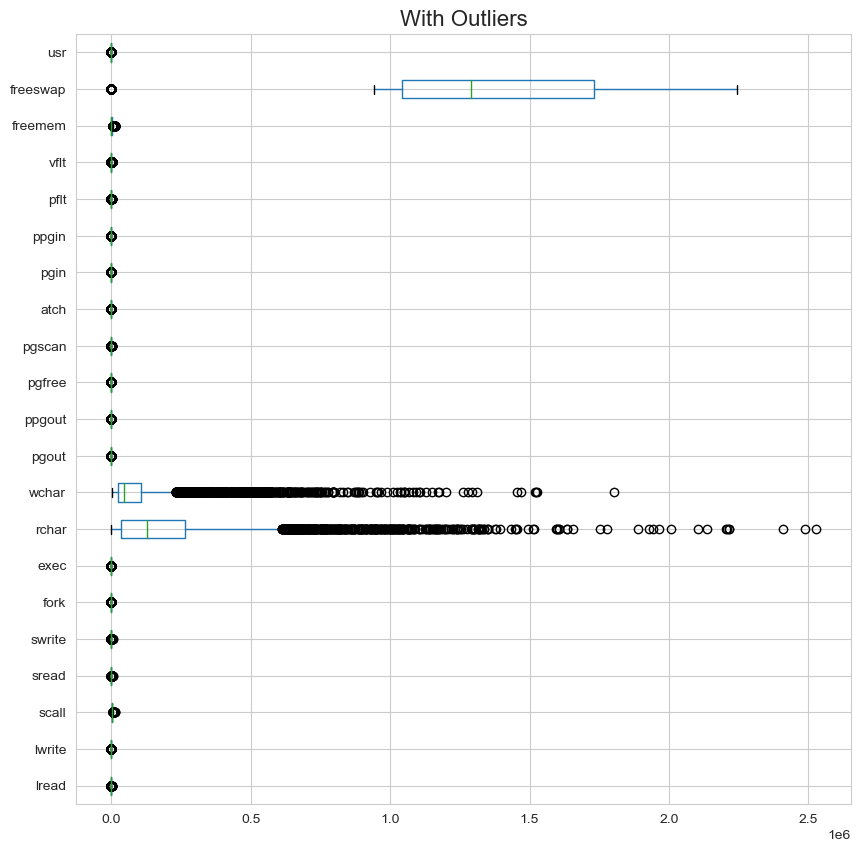

In [759]:
# construct box plot for continuous variables
cont=df1.dtypes[(df1.dtypes!='uint8')].index
plt.figure(figsize=(10,10))
df1[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [760]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [761]:
for column in df1[cont].columns:
    lr,ur=remove_outlier(df1[column])
    df1[column]=np.where(df1[column]>ur,ur,df1[column])
    df1[column]=np.where(df1[column]<lr,lr,df1[column])

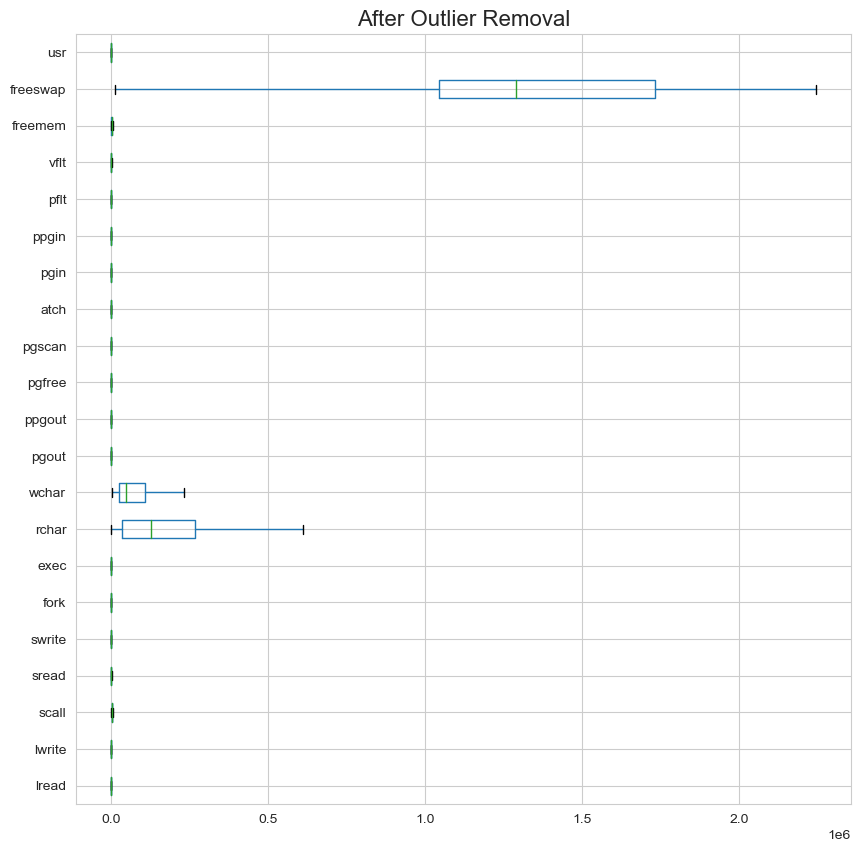

In [762]:
plt.figure(figsize=(10,10))
df1[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

In [763]:
df1.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95.0,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97.0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87.0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98.0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90.0,1


In [764]:
X1 = df1.drop('usr', axis=1)
y1 = df1[['usr']]
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.30 , random_state=10)
import statsmodels.api as sm
X1_train=sm.add_constant(X1_train)
X1_test=sm.add_constant(X1_test)
model1 = sm.OLS(y1_train,X1_train).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.788
Method:                 Least Squares   F-statistic:                     1067.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:34:17   Log-Likelihood:                -16693.
No. Observations:                5734   AIC:                         3.343e+04
Df Residuals:                    5713   BIC:                         3.357e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.7987 

In [765]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series10 = pd.Series(
    [variance_inflation_factor(X1_train.values, i) for i in range(X1_train.shape[1])],
    index=X1_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series10))

VIF values: 

const                   28.515172
lread                    5.398689
lwrite                   4.405770
scall                    2.979082
sread                    6.633749
swrite                   5.696713
fork                    12.968533
exec                     3.072187
rchar                    2.090271
wchar                    1.602503
pgout                   11.879732
ppgout                  31.009455
pgfree                  16.925098
pgscan                        NaN
atch                     1.816372
pgin                    14.299688
ppgin                   14.591662
pflt                    11.715842
vflt                    15.458670
freemem                  1.943516
freeswap                 1.813707
runqsz_Not_CPU_Bound     1.138810
dtype: float64



E:\Anaconda\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


In [766]:
X1_train = X1_train.drop(['sread', 'swrite','fork','exec','pgout','ppgout','pgfree', 'pgscan','pgin',
       'ppgin','vflt','lread'], axis=1)

In [767]:
X1_train=sm.add_constant(X1_train)
X1_test=sm.add_constant(X1_test)
model2 = sm.OLS(y1_train,X1_train).fit()
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.773
Method:                 Least Squares   F-statistic:                     2166.
Date:                Sun, 04 Jun 2023   Prob (F-statistic):               0.00
Time:                        11:34:18   Log-Likelihood:                -16901.
No. Observations:                5734   AIC:                         3.382e+04
Df Residuals:                    5724   BIC:                         3.389e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   82.3740 

In [768]:
vif_series11 = pd.Series(
    [variance_inflation_factor(X1_train.values, i) for i in range(X1_train.shape[1])],
    index=X1_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series11))

VIF values: 

const                   25.779733
lwrite                   1.045200
scall                    1.755735
rchar                    1.602286
wchar                    1.422387
atch                     1.333287
pflt                     1.445830
freemem                  1.810747
freeswap                 1.665313
runqsz_Not_CPU_Bound     1.121570
dtype: float64



In [845]:
X1_train.columns

Index(['const', 'lwrite', 'scall', 'rchar', 'wchar', 'atch', 'pflt', 'freemem',
       'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [847]:
X1_test = X1_test.drop(['sread', 'swrite','fork','exec','pgout','ppgout','pgfree', 'pgscan','pgin',
       'ppgin','vflt','lread'], axis=1)
X1_test.columns

Index(['const', 'lwrite', 'scall', 'rchar', 'wchar', 'atch', 'pflt', 'freemem',
       'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [848]:
regression_model2 = LinearRegression()
regression_model2.fit(X1_train, y1_train)

LinearRegression()

In [849]:
for idx, col_name in enumerate(X1_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model2.coef_[0][idx]))

The coefficient for const is 0.0
The coefficient for lwrite is -0.026999277901017242
The coefficient for scall is -0.0009185345259345895
The coefficient for rchar is -6.3224984064655255e-06
The coefficient for wchar is -7.2904063352398775e-06
The coefficient for atch is -0.5147410489440302
The coefficient for pflt is -0.049054452028481056
The coefficient for freemem is -0.00030143047649813066
The coefficient for freeswap is 9.638324671370258e-06
The coefficient for runqsz_Not_CPU_Bound is 1.659989658352752


In [850]:
regression_model2.coef_

array([[ 0.00000000e+00, -2.69992779e-02, -9.18534526e-04,
        -6.32249841e-06, -7.29040634e-06, -5.14741049e-01,
        -4.90544520e-02, -3.01430476e-04,  9.63832467e-06,
         1.65998966e+00]])

In [851]:
# Let us check the intercept for the model

intercept1 = regression_model2.intercept_[0]

print("The intercept for our model is {}".format(intercept1))

The intercept for our model is 82.37395226904194


In [852]:
# R square on training data
regression_model2.score(X1_train, y1_train)

0.7730549176253306

In [853]:
# R square on testing data
regression_model2.score(X1_test, y1_test)

0.7721966969408431

In [854]:
#RMSE on Training data

predicted_train1=regression_model2.fit(X1_train, y1_train).predict(X1_train)
np.sqrt(metrics.mean_squared_error(y1_train,predicted_train1))

4.611404985305474

In [855]:
#RMSE on Testing data
predicted_test1=regression_model2.fit(X1_train, y1_train).predict(X1_test)
np.sqrt(metrics.mean_squared_error(y1_test,predicted_test1))

4.725737610675853

### Problem 2

### Logistic Regression

In [769]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

In [770]:
ind_data=pd.read_excel("Contraceptive_method_dataset.xlsx")

In [771]:
ind_data.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [772]:
ind_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [773]:
ind_data.tail(10)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1463,30.0,Uneducated,Secondary,NaN,Scientology,No,3,Very High,Exposed,Yes
1464,23.0,Primary,Primary,NaN,Scientology,No,2,Very High,Exposed,Yes
1465,25.0,Primary,Tertiary,NaN,Scientology,No,1,High,Exposed,Yes
1466,42.0,Primary,Tertiary,NaN,Scientology,No,2,Very High,Exposed,Yes
1467,29.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [774]:
ind_data.shape

(1473, 10)

In [775]:
ind_data.dtypes

Wife_age                     float64
Wife_ education               object
Husband_education             object
No_of_children_born          float64
Wife_religion                 object
Wife_Working                  object
Husband_Occupation             int64
Standard_of_living_index      object
Media_exposure                object
Contraceptive_method_used     object
dtype: object

In [776]:
ind_data.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1402.000000,1452.000000,1473.000000
mean,32.606277,3.254132,2.137814
std,8.274927,2.365212,0.864857
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,39.000000,4.000000,3.000000
max,49.000000,16.000000,4.000000


In [777]:
dups = ind_data.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(ind_data.shape)

Number of duplicate rows = 80
(1473, 10)


In [778]:
ind_data.drop_duplicates(inplace=True) 

In [779]:
dups = ind_data.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(ind_data.shape)

Number of duplicate rows = 0
(1393, 10)


In [780]:
ind_data.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [781]:
ind_data['Wife_age'].median()

32.0

In [782]:
ind_data['No_of_children_born'].median()

3.0

In [783]:
ind_data['Wife_age'] = ind_data['Wife_age'].replace(np.nan,ind_data['Wife_age'].median())
ind_data['No_of_children_born'] = ind_data['No_of_children_born'].replace(np.nan,ind_data['No_of_children_born'].median())

In [784]:
ind_data.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

<AxesSubplot:xlabel='Wife_age', ylabel='Count'>

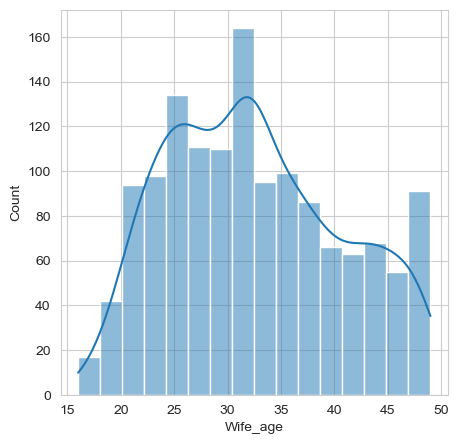

In [785]:
plt.figure(figsize=(5,5))
sns.histplot(ind_data['Wife_age'], kde=True)

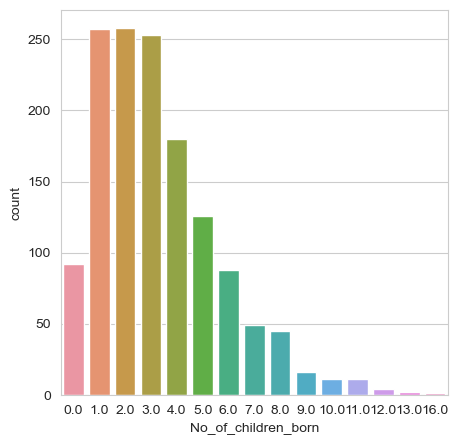

2.0     18.521177
1.0     18.449390
3.0     18.162240
4.0     12.921752
5.0      9.045226
0.0      6.604451
6.0      6.317301
7.0      3.517588
8.0      3.230438
9.0      1.148600
10.0     0.789663
11.0     0.789663
12.0     0.287150
13.0     0.143575
16.0     0.071788
Name: No_of_children_born, dtype: float64

In [786]:
plt.figure(figsize=(5,5))
sns.countplot(data=ind_data, x='No_of_children_born')
plt.show()
ind_data['No_of_children_born'].value_counts(normalize=True)*100

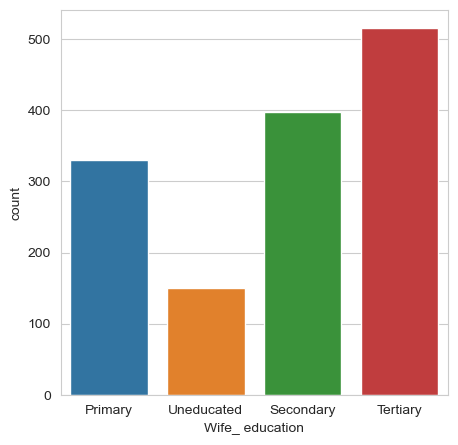

Tertiary      36.970567
Secondary     28.571429
Primary       23.689878
Uneducated    10.768126
Name: Wife_ education, dtype: float64

In [787]:
plt.figure(figsize=(5,5))
sns.countplot(data=ind_data, x='Wife_ education')
plt.show()
ind_data['Wife_ education'].value_counts(normalize=True)*100

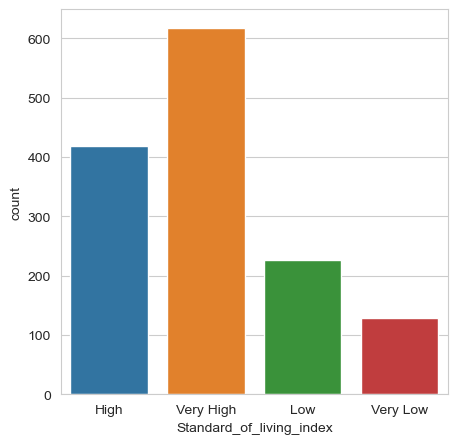

Very High    44.364681
High         30.078966
Low          16.295765
Very Low      9.260589
Name: Standard_of_living_index, dtype: float64

In [788]:
plt.figure(figsize=(5,5))
sns.countplot(data=ind_data, x='Standard_of_living_index')
plt.show()
ind_data['Standard_of_living_index'].value_counts(normalize=True)*100

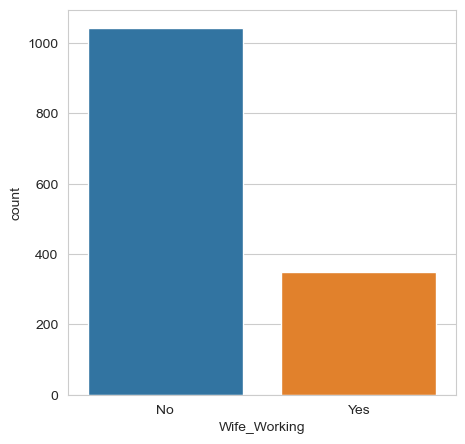

No     74.874372
Yes    25.125628
Name: Wife_Working, dtype: float64

In [789]:
plt.figure(figsize=(5,5))
sns.countplot(data=ind_data, x='Wife_Working')
plt.show()
ind_data['Wife_Working'].value_counts(normalize=True)*100

<AxesSubplot:xlabel='Wife_Working', ylabel='No_of_children_born'>

<Figure size 500x500 with 0 Axes>

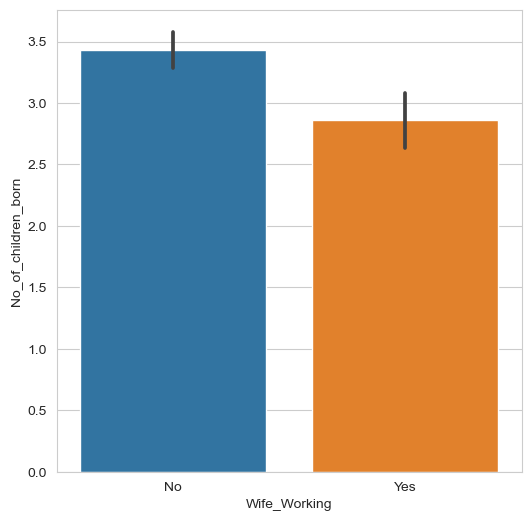

In [790]:
plt.figure(figsize=(5,5))
fig = plt.subplots(figsize=fig_dims)
sns.barplot(x='Wife_Working', y='No_of_children_born', data=ind_data)

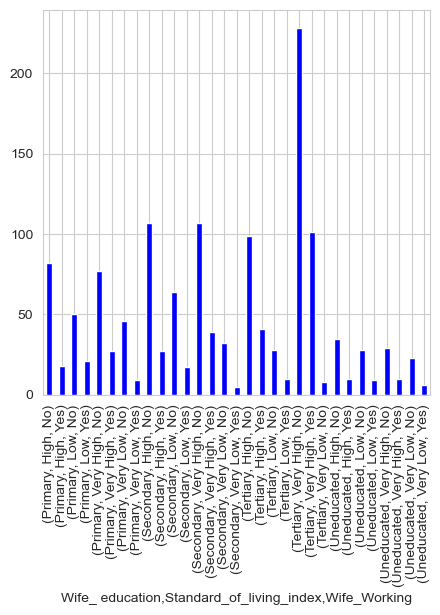

In [791]:
plt.figure(figsize=(5,5))
group = ind_data.groupby(["Wife_ education", "Standard_of_living_index"]).Wife_Working.value_counts()
group.plot.bar(color="blue")
plt.show()

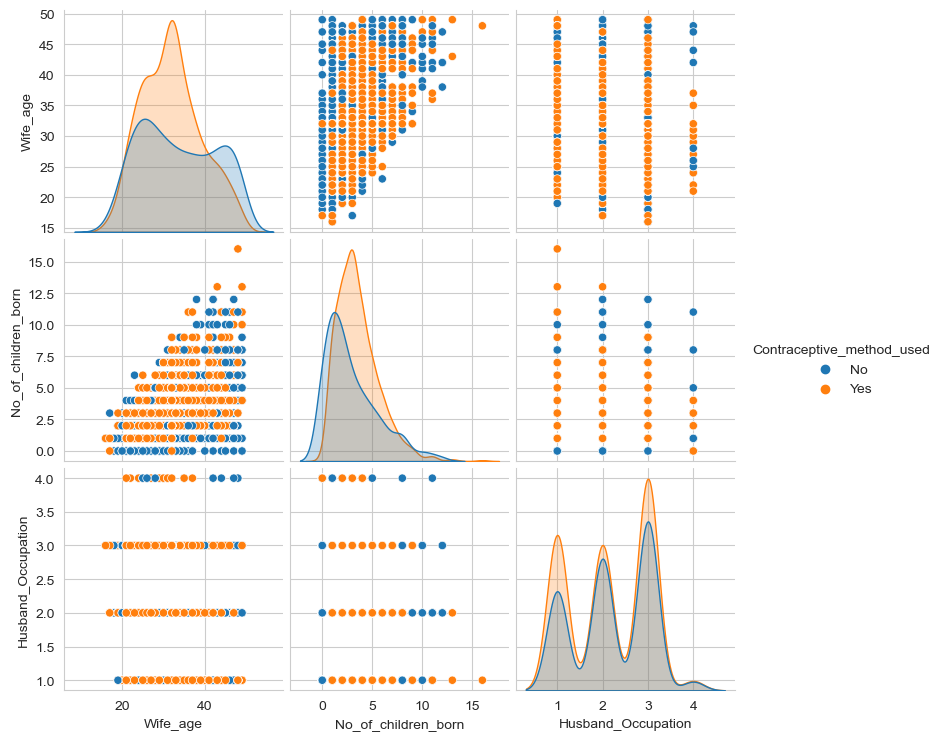

In [792]:
sns.pairplot(ind_data , hue='Contraceptive_method_used' , diag_kind = 'kde')

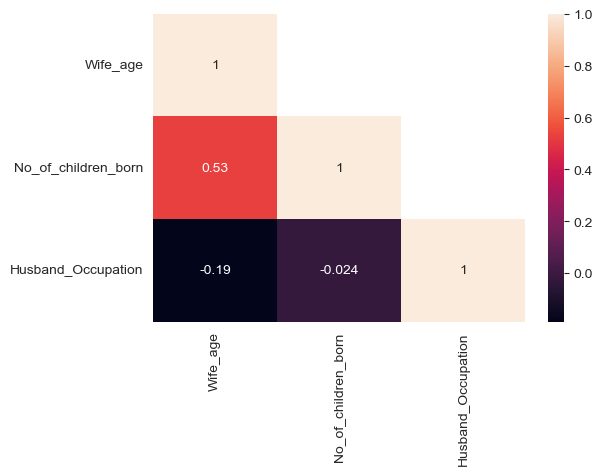

In [793]:
plt.figure(figsize=(6,4))
sns.heatmap(ind_data.corr(), annot=True,mask=np.triu(ind_data.corr(),+1));

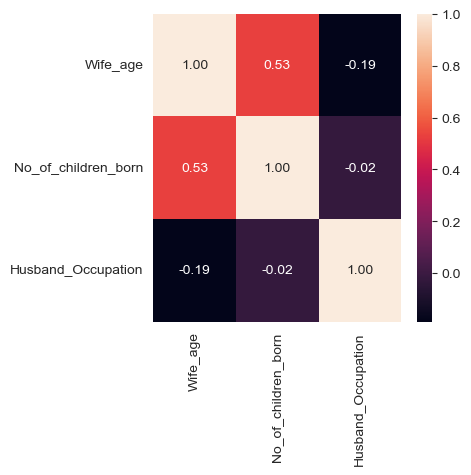

In [794]:
plt.figure(figsize=(4,4))
sns.heatmap(ind_data.corr(),annot=True,fmt=".2f");

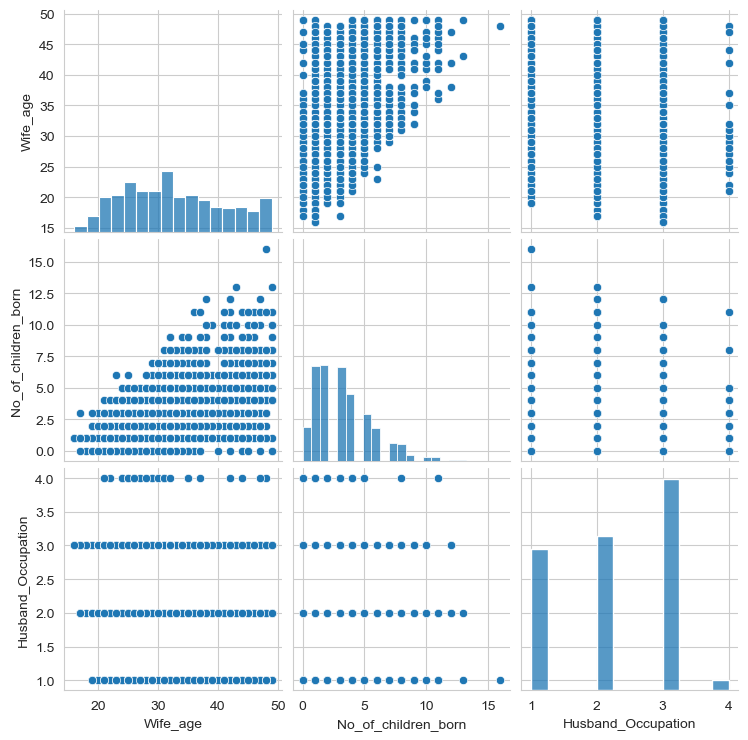

In [795]:
sns.pairplot(ind_data)
plt.show()

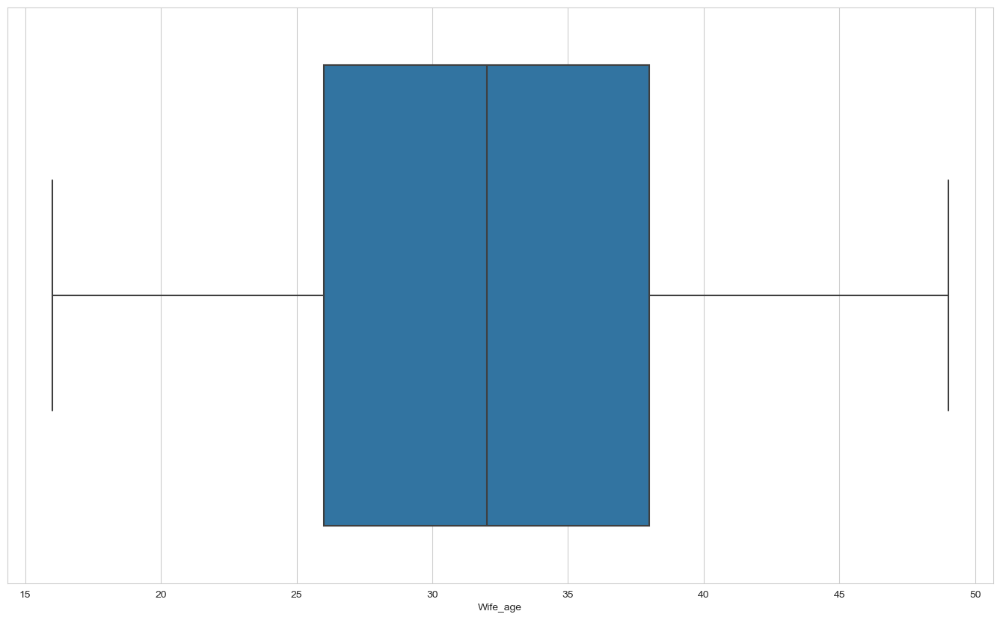

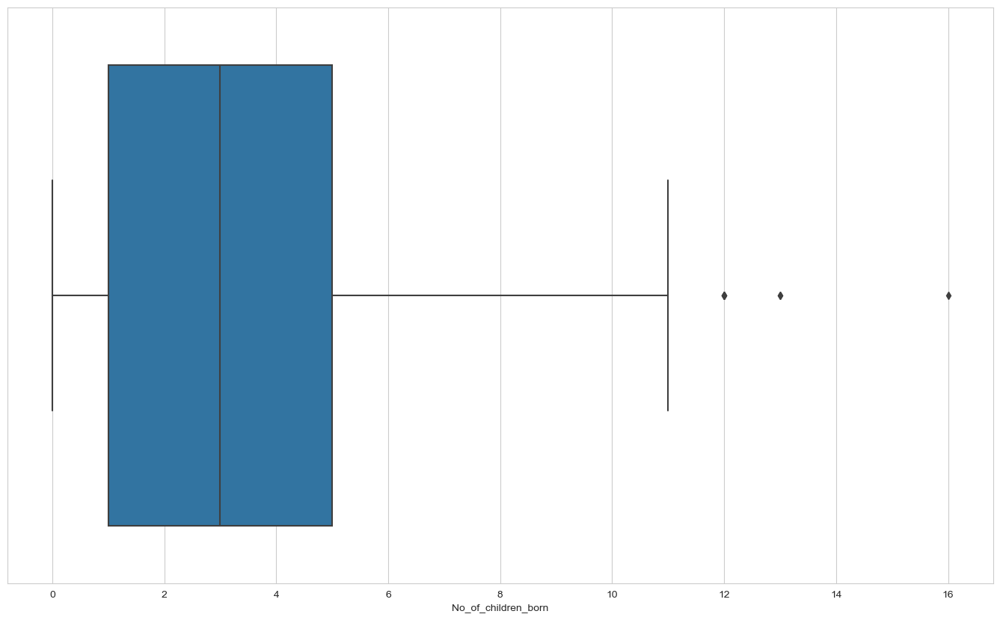

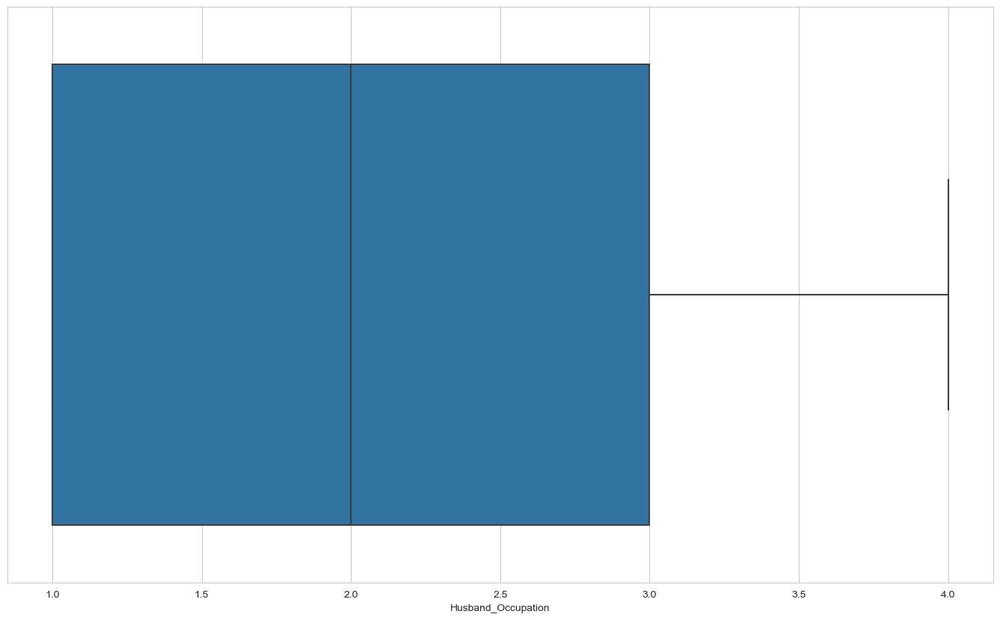

In [796]:
sns.boxplot(data=ind_data, x='Wife_age');
plt.show()
sns.boxplot(data=ind_data, x='No_of_children_born');
plt.show()
sns.boxplot(data=ind_data, x='Husband_Occupation');
plt.show()

In [797]:
ind_data.tail(10)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1463,30.0,Uneducated,Secondary,3.0,Scientology,No,3,Very High,Exposed,Yes
1464,23.0,Primary,Primary,3.0,Scientology,No,2,Very High,Exposed,Yes
1465,25.0,Primary,Tertiary,3.0,Scientology,No,1,High,Exposed,Yes
1466,42.0,Primary,Tertiary,3.0,Scientology,No,2,Very High,Exposed,Yes
1467,29.0,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes
1468,33.0,Tertiary,Tertiary,3.0,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,3.0,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,3.0,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [798]:
for feature in ind_data.columns: 
    if ind_data[feature].dtype == 'object': 
        print(feature)
        print(ind_data[feature].value_counts())
        print('\n')

Wife_ education
Tertiary      515
Secondary     398
Primary       330
Uneducated    150
Name: Wife_ education, dtype: int64


Husband_education
Tertiary      827
Secondary     347
Primary       175
Uneducated     44
Name: Husband_education, dtype: int64


Wife_religion
Scientology        1186
Non-Scientology     207
Name: Wife_religion, dtype: int64


Wife_Working
No     1043
Yes     350
Name: Wife_Working, dtype: int64


Standard_of_living_index
Very High    618
High         419
Low          227
Very Low     129
Name: Standard_of_living_index, dtype: int64


Media_exposure 
Exposed        1284
Not-Exposed     109
Name: Media_exposure , dtype: int64


Contraceptive_method_used
Yes    779
No     614
Name: Contraceptive_method_used, dtype: int64




In [799]:
dt=ind_data.copy()
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
dt['Wife_ education']= label_encoder.fit_transform(dt['Wife_ education'])
dt['Husband_education']= label_encoder.fit_transform(dt['Husband_education'])
dt['Standard_of_living_index']= label_encoder.fit_transform(dt['Standard_of_living_index'])

In [800]:
dt = pd.get_dummies(dt, columns=['Wife_religion', 'Wife_Working', 'Contraceptive_method_used'],drop_first=True)

In [801]:
dt.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Husband_Occupation,Standard_of_living_index,Media_exposure,Wife_religion_Scientology,Wife_Working_Yes,Contraceptive_method_used_Yes
0,24.0,0,1,3.0,2,0,Exposed,1,0,0
1,45.0,3,1,10.0,3,2,Exposed,1,0,0
2,43.0,0,1,7.0,3,2,Exposed,1,0,0
3,42.0,1,0,9.0,3,0,Exposed,1,0,0
4,36.0,1,1,8.0,3,1,Exposed,1,0,0


In [802]:
columns=dt.get('Media_exposure')
dt = pd.get_dummies(dt, columns,drop_first=True)

In [803]:
dt.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Husband_Occupation,Standard_of_living_index,Wife_religion_Scientology,Wife_Working_Yes,Contraceptive_method_used_Yes,Media_exposure _Not-Exposed
0,24.0,0,1,3.0,2,0,1,0,0,0
1,45.0,3,1,10.0,3,2,1,0,0,0
2,43.0,0,1,7.0,3,2,1,0,0,0
3,42.0,1,0,9.0,3,0,1,0,0,0
4,36.0,1,1,8.0,3,1,1,0,0,0


In [804]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Wife_age                       1393 non-null   float64
 1   Wife_ education                1393 non-null   int32  
 2   Husband_education              1393 non-null   int32  
 3   No_of_children_born            1393 non-null   float64
 4   Husband_Occupation             1393 non-null   int64  
 5   Standard_of_living_index       1393 non-null   int32  
 6   Wife_religion_Scientology      1393 non-null   uint8  
 7   Wife_Working_Yes               1393 non-null   uint8  
 8   Contraceptive_method_used_Yes  1393 non-null   uint8  
 9   Media_exposure _Not-Exposed    1393 non-null   uint8  
dtypes: float64(2), int32(3), int64(1), uint8(4)
memory usage: 97.6 KB


In [805]:
dt.shape

(1393, 10)

In [806]:
for feature in dt.columns: 
    if dt[feature].dtype == 'uint8': 
        print(feature)
        print(dt[feature].value_counts())
        print('\n')

Wife_religion_Scientology
1    1186
0     207
Name: Wife_religion_Scientology, dtype: int64


Wife_Working_Yes
0    1043
1     350
Name: Wife_Working_Yes, dtype: int64


Contraceptive_method_used_Yes
1    779
0    614
Name: Contraceptive_method_used_Yes, dtype: int64


Media_exposure _Not-Exposed
0    1284
1     109
Name: Media_exposure _Not-Exposed, dtype: int64




In [807]:
dt.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Husband_Occupation,Standard_of_living_index,Wife_religion_Scientology,Wife_Working_Yes,Contraceptive_method_used_Yes,Media_exposure _Not-Exposed
0,24.0,0,1,3.0,2,0,1,0,0,0
1,45.0,3,1,10.0,3,2,1,0,0,0
2,43.0,0,1,7.0,3,2,1,0,0,0
3,42.0,1,0,9.0,3,0,1,0,0,0
4,36.0,1,1,8.0,3,1,1,0,0,0


In [808]:
dt.shape

(1393, 10)

In [809]:
X2 = dt.drop('Contraceptive_method_used_Yes', axis=1)
y2 = dt['Contraceptive_method_used_Yes']

In [810]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.30, random_state=10)

In [811]:
model = LogisticRegression()
model.fit(X2_train, y2_train)
y_predict = model.predict(X2_test)
model_score = model.score(X2_test, y2_test)
print(model_score)
print(metrics.confusion_matrix(y2_test, y_predict))
print(metrics.classification_report(y2_test, y_predict))

0.6076555023923444
[[ 67 117]
 [ 47 187]]
              precision    recall  f1-score   support

           0       0.59      0.36      0.45       184
           1       0.62      0.80      0.70       234

    accuracy                           0.61       418
   macro avg       0.60      0.58      0.57       418
weighted avg       0.60      0.61      0.59       418



E:\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy for the model = 61%

In [812]:
ytrain_predict = model.predict(X2_train)
ytest_predict = model.predict(X2_test)

AUC: 0.684


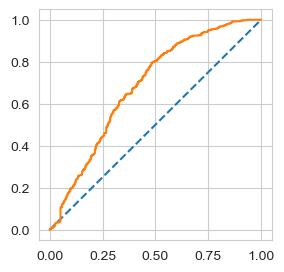

In [813]:
plt.figure(figsize=(3,3))
# predict probabilities
probs = model.predict_proba(X2_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y2_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y2_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC: 0.684


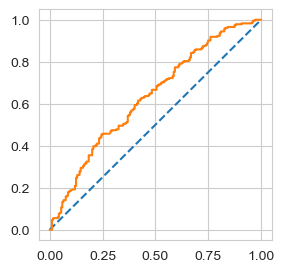

In [814]:
plt.figure(figsize=(3,3))
# predict probabilities
probs = model.predict_proba(X2_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y2_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y2_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

E:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


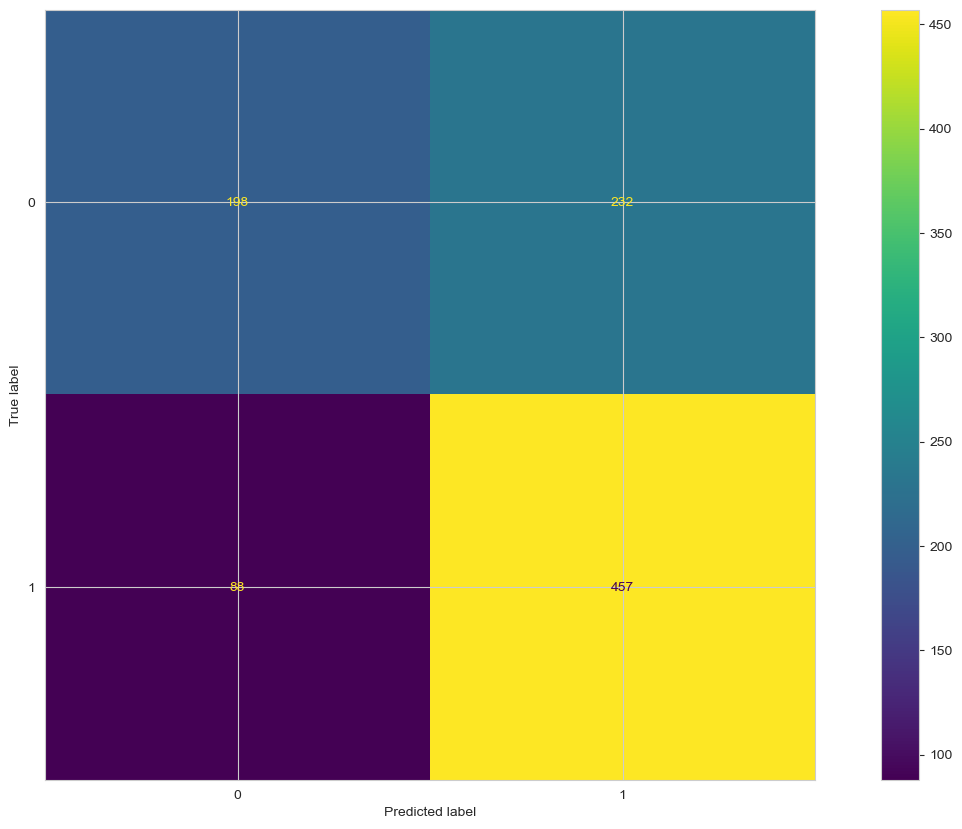

In [815]:
fig_dims = (6, 6)
plot_confusion_matrix(model,X2_train,y2_train);

In [816]:
print(classification_report(y2_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.69      0.46      0.55       430
           1       0.66      0.84      0.74       545

    accuracy                           0.67       975
   macro avg       0.68      0.65      0.65       975
weighted avg       0.68      0.67      0.66       975



E:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 500x500 with 0 Axes>

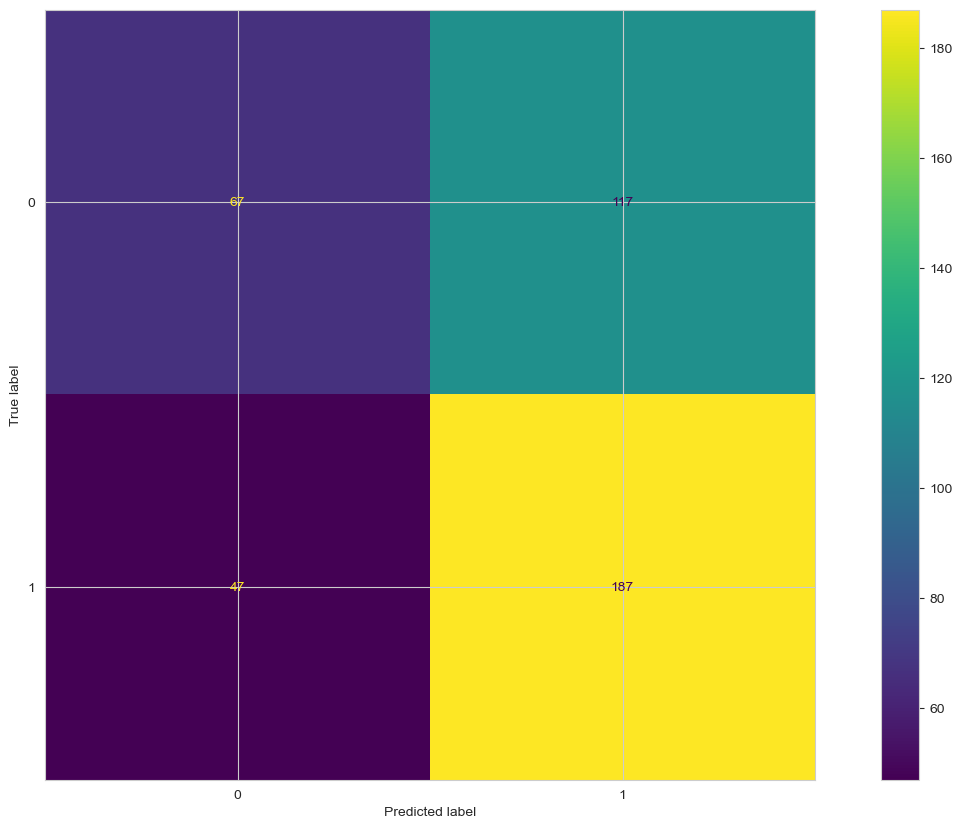

In [817]:
plt.figure(figsize=(5,5))
plot_confusion_matrix(model,X2_test,y2_test);

In [818]:
print(classification_report(y2_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.59      0.36      0.45       184
           1       0.62      0.80      0.70       234

    accuracy                           0.61       418
   macro avg       0.60      0.58      0.57       418
weighted avg       0.60      0.61      0.59       418



#### Inferences :
    
For predicting Contraceptive_method_used (yes) (Label 1 ):

Precision (62%) – 62% of women predicted are actually used Contraceptive_method  out of all women predicted to used the Contraceptive method.

Recall (80%) – Out of all the women who actually used Contraceptive_method, 80% of women have been predicted correctly .

For predicting Contraceptive_method_used (No) (Label 0 ):

Precision (59%) – 59% of women predicted are actually not used Contraceptive_method  out of all women predicted tobe not used the Contraceptive method.

Recall (36%) – Out of all the women who actually not used Contraceptive_method, 36% of women have been predicted correctly .

Overall accuracy of the model – 61 % of total predictions are correct

Accuracy, AUC, Precision and Recall for test data is almost inline with training data. This proves no overfitting or underfitting has happened, and overall the model is a good model for classification

#### LInear Discriminant analysis

In [819]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [820]:
from sklearn import metrics,model_selection
from sklearn.metrics import accuracy_score
X11 = dt.drop('Contraceptive_method_used_Yes', axis=1)
y11 = dt['Contraceptive_method_used_Yes']

In [821]:
X11_train,X11_test,y11_train,y11_test = model_selection.train_test_split(X11,y11,test_size=0.30,random_state=10)

In [822]:
clf = LinearDiscriminantAnalysis()
model=clf.fit(X11,y11)
model

LinearDiscriminantAnalysis()

In [823]:
y11_pred = clf.predict(X11_test)

True Positive 184
True Negative 68
False Positive 116
False Negative 50


<Figure size 500x500 with 0 Axes>

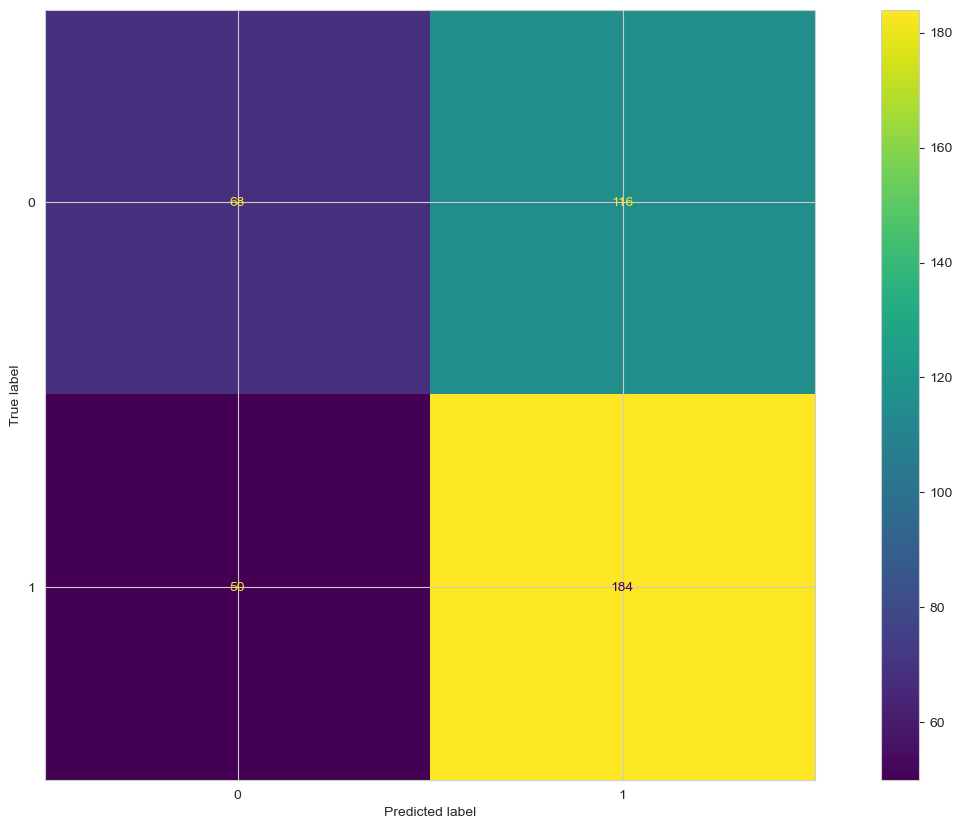

In [824]:
from sklearn.metrics import ConfusionMatrixDisplay,precision_score,recall_score
tn, fp, fn, tp = confusion_matrix(list(y11_test), list(y11_pred), labels=[0, 1]).ravel()
plt.figure(figsize=(5,5)) 
print('True Positive', tp)
print('True Negative', tn)
print('False Positive', fp)
print('False Negative', fn)

ConfusionMatrixDisplay.from_predictions(y11_test, y11_pred)
plt.show()

In [825]:
accuracy = accuracy_score(y11_test, y11_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.60


In [826]:
pred_class_train = model.predict(X11_train)
pred_class_test = model.predict(X11_test)

In [827]:
print(classification_report(y11_train, pred_class_train))

              precision    recall  f1-score   support

           0       0.68      0.46      0.55       430
           1       0.66      0.83      0.73       545

    accuracy                           0.66       975
   macro avg       0.67      0.64      0.64       975
weighted avg       0.67      0.66      0.65       975



In [828]:
print(classification_report(y11_test, pred_class_test))

              precision    recall  f1-score   support

           0       0.58      0.37      0.45       184
           1       0.61      0.79      0.69       234

    accuracy                           0.60       418
   macro avg       0.59      0.58      0.57       418
weighted avg       0.60      0.60      0.58       418



#### Inferences :

For predicting Contraceptive_method_used (yes) (Label 1 ):

Precision (61%) – 61% of women predicted are actually used Contraceptive_method out of all women predicted to used the Contraceptive method.

Recall (79%) – Out of all the women who actually used Contraceptive_method, 79% of women have been predicted correctly .

For predicting Contraceptive_method_used (No) (Label 0 ):

Precision (58%) – 58% of women predicted are actually not used Contraceptive_method out of all women predicted tobe not used the Contraceptive method.

Recall (37%) – Out of all the women who actually not used Contraceptive_method, 37% of women have been predicted correctly .

Overall accuracy of the model – 60 % of total predictions are correct


#### CART (DECISION TREE)

In [829]:
from sklearn.tree import DecisionTreeClassifier
X22 = dt.drop('Contraceptive_method_used_Yes', axis=1)
y22 = dt['Contraceptive_method_used_Yes']
X22_train, X22_test, train_labels, test_labels = train_test_split(X22, y22, test_size=.30, random_state=10)

In [830]:
dt_model = DecisionTreeClassifier(criterion = 'gini' )

In [831]:
dt_model.fit(X22_train, train_labels)

DecisionTreeClassifier()

In [832]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X22_train.columns))

                                  Imp
Wife_age                     0.338372
Wife_ education              0.100468
Husband_education            0.061379
No_of_children_born          0.235702
Husband_Occupation           0.083778
Standard_of_living_index     0.092881
Wife_religion_Scientology    0.028496
Wife_Working_Yes             0.044690
Media_exposure _Not-Exposed  0.014233


In [833]:
y22_predict = dt_model.predict(X22_test)

In [834]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X22_train, train_labels)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [835]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X22_train.columns))

                                  Imp
Wife_age                     0.338372
Wife_ education              0.100468
Husband_education            0.061379
No_of_children_born          0.235702
Husband_Occupation           0.083778
Standard_of_living_index     0.092881
Wife_religion_Scientology    0.028496
Wife_Working_Yes             0.044690
Media_exposure _Not-Exposed  0.014233


In [836]:
ytrain_predict1 = reg_dt_model.predict(X22_train)
ytest_predict1 = reg_dt_model.predict(X22_test)

AUC: 0.827


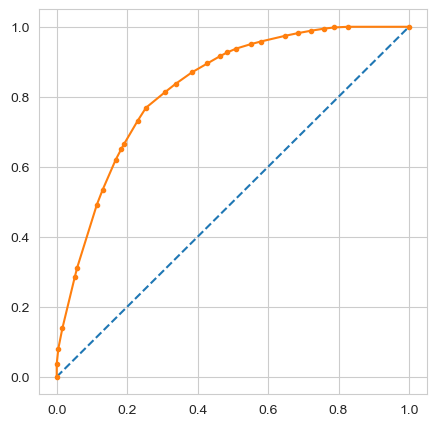

In [837]:
# AUC and ROC for the training data

# predict probabilities
plt.figure(figsize=(5,5))
probs = reg_dt_model.predict_proba(X22_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

AUC: 0.695


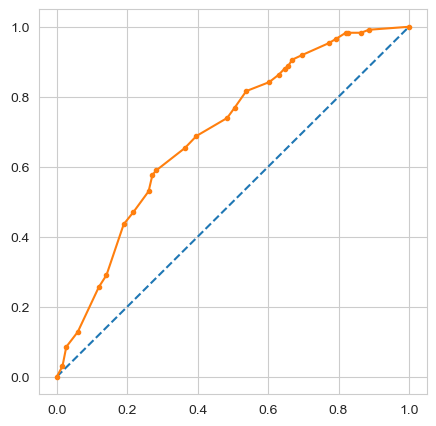

In [838]:
# AUC and ROC for the test data


# predict probabilities
plt.figure(figsize=(5,5))
probs = reg_dt_model.predict_proba(X22_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [839]:
print(classification_report(train_labels, ytrain_predict1))

              precision    recall  f1-score   support

           0       0.74      0.69      0.72       430
           1       0.77      0.81      0.79       545

    accuracy                           0.76       975
   macro avg       0.76      0.75      0.75       975
weighted avg       0.76      0.76      0.76       975



In [840]:
print(classification_report(test_labels, ytest_predict1))

              precision    recall  f1-score   support

           0       0.61      0.52      0.56       184
           1       0.66      0.74      0.70       234

    accuracy                           0.64       418
   macro avg       0.63      0.63      0.63       418
weighted avg       0.64      0.64      0.64       418



In [841]:
confusion_matrix(train_labels, ytrain_predict1)

array([[298, 132],
       [102, 443]], dtype=int64)

In [842]:
confusion_matrix(test_labels, ytest_predict1)

array([[ 95,  89],
       [ 61, 173]], dtype=int64)

In [843]:
reg_dt_model.score(X22_train,train_labels)

0.76

In [844]:
reg_dt_model.score(X22_test,test_labels)

0.6411483253588517

#### Inferences :

For predicting Contraceptive_method_used (yes) (Label 1 ):

Precision (66%) – 66% of women predicted are actually used Contraceptive_method out of all women predicted to used the Contraceptive method.

Recall (74%) – Out of all the women who actually used Contraceptive_method, 74% of women have been predicted correctly .

For predicting Contraceptive_method_used (No) (Label 0 ):

Precision (61%) – 61% of women predicted are actually not used Contraceptive_method out of all women predicted tobe not used the Contraceptive method.

Recall (52%) – Out of all the women who actually not used Contraceptive_method, 52% of women have been predicted correctly .

Overall accuracy of the model – 64 % of total predictions are correct

Accuracy, AUC, Precision and Recall for test data is almost inline with training data. This proves no overfitting or underfitting has happened, and overall the model is a good model for classification